<a href="https://colab.research.google.com/github/MavielS/Projets_DS/blob/master/P4/Exploration.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Avant toute chose, il est nécessaire d'importer les datasets (2015-building... et 2016-building...) ainsi qu'un fichier tiers (exploration.py)** <br>
Cela peut prendre un peu de temps en fonction de votre débit internet. <br>

Les datasets sont à télécharger à [cette adresse](https://www.kaggle.com/city-of-seattle/sea-building-energy-benchmarking#2015-building-energy-benchmarking.csv).

In [1]:
from google.colab import files
uploaded = files.upload()
for fn in uploaded.keys():
  print('Vous avez importé le fichier "{name}" qui a une taille de {length} bytes'.format(name=fn, length=len(uploaded[fn])))

Saving 2015-building-energy-benchmarking.csv to 2015-building-energy-benchmarking.csv
Saving 2016-building-energy-benchmarking.csv to 2016-building-energy-benchmarking.csv
Saving exploration.py to exploration.py
Vous avez importé le fichier "2015-building-energy-benchmarking.csv" qui a une taille de 1588303 bytes
Vous avez importé le fichier "2016-building-energy-benchmarking.csv" qui a une taille de 1235434 bytes
Vous avez importé le fichier "exploration.py" qui a une taille de 7917 bytes


Il faut aussi installer certaines dépendances

In [3]:
!pip install squarify

  Using cached squarify-0.4.3-py3-none-any.whl (4.3 kB)


You should consider upgrading via the 'c:\users\sebas\desktop\ds_projects\emissions-ges-seattle\emissions_venv\scripts\python.exe -m pip install --upgrade pip' command.


**Anticipez les besoins en consommation électrique de bâtiments**

Des relevés minutieux ont été effectués par vos agents en 2015 et en 2016. <br>

**Problématique**

   - Peut-t-on **prédire les émissions de CO2 et la consommation totale d’énergie de bâtiments** pour lesquels elles n’ont pas encore été mesurées ?
   - Quel est **l'intérêt l'ENERGY STAR SCORE** dans notre modélisation ?

**Missions**

   - Réaliser une analyse exploratoire des données;
   - Tester différents modèles de prédiction afin de répondre à la problématique;
   - Évaluer ces différents modèles de prédiction
   - Évaluer l'intérêt de l'ENERGY STAR SCORE.

**Compétences évaluées**

   - Mettre en place le modèle d'apprentissage supervisé adapté au problème métier
   - Adapter les hyperparamètres d'un algorithme d'apprentissage supervisé afin de l'améliorer
   - Évaluer les performances d’un modèle d'apprentissage supervisé
   - Transformer les variables pertinentes d'un modèle d'apprentissage supervisé


# Sommaire

* [Normalisation des colonnes de datasets](#Normalisation-des-colonnes-des-datasets)
    * [Exploration des différences des variables](#Exploration-des-différences-des-variables)
    * [Correction des différences des variables](#Correction-des-différences-des-variables)
    * [Exploration des types des variables](#Exploration-des-types-des-variables)
    * [Correction des types des variables](#Correction-des-types-des-variables)
    * [Création Train/Test set](#Création-Train/Test-set)
* [EDA](#EDA)
    * [Analyse de la forme](#Analyse-de-la-forme)
    * [Analyse du fond](#Analyse-du-fond)
    * [Analyse bivariée target](#Analyse-bivariée-target)

In [3]:
import pandas as pd
import exploration as ex

pd.options.display.max_columns = 50
%matplotlib inline

In [4]:
d_2015 = pd.read_csv('2015-building-energy-benchmarking.csv')
d_2016 = pd.read_csv('2016-building-energy-benchmarking.csv')

Définition des colonnes: <br>
2015: https://data.seattle.gov/dataset/2015-Building-Energy-Benchmarking/h7rm-fz6m <br>
2016: https://data.seattle.gov/dataset/2016-Building-Energy-Benchmarking/2bpz-gwpy

# Normalisation des colonnes des datasets

In [5]:
ex.analyse_forme(d_2015)

+----+----------+-------------+---------------+------------+----------------+
|    |   Taille |   Nb lignes |   Nb colonnes |   % de NaN |   Nb duplicats |
|----+----------+-------------+---------------+------------+----------------|
|  0 |   156980 |        3340 |            47 |      16.89 |              0 |
+----+----------+-------------+---------------+------------+----------------+


In [6]:
ex.analyse_forme(d_2016)

+----+----------+-------------+---------------+------------+----------------+
|    |   Taille |   Nb lignes |   Nb colonnes |   % de NaN |   Nb duplicats |
|----+----------+-------------+---------------+------------+----------------|
|  0 |   155296 |        3376 |            46 |      12.85 |              0 |
+----+----------+-------------+---------------+------------+----------------+


J'ai environ 15% de NaN, pas de duplicats, le dataset est assez propre.

Je cherche à observer les différences de variables dans ces 2 datasets.

## Exploration des différences des variables

In [7]:
set(d_2015) - set(d_2016)

{'2010 Census Tracts',
 'City Council Districts',
 'Comment',
 'GHGEmissions(MetricTonsCO2e)',
 'GHGEmissionsIntensity(kgCO2e/ft2)',
 'Location',
 'OtherFuelUse(kBtu)',
 'SPD Beats',
 'Seattle Police Department Micro Community Policing Plan Areas',
 'Zip Codes'}

Il semblerait que j'ai 10 colonnes de 2015 non présentes dans le dataset de 2016. <br>
Je vérifie qu'il ne s'agit pas d'erreurs de typo, je regarde donc les colonnes de 2016 qui ne sont pas des colonnes de 2015. <br>

In [8]:
set(d_2016) - set(d_2015)

{'Address',
 'City',
 'Comments',
 'GHGEmissionsIntensity',
 'Latitude',
 'Longitude',
 'State',
 'TotalGHGEmissions',
 'ZipCode'}

Dans le dataset de 2016, le contenu de la colonne *Location* a été éclatée en plusieurs variables (latitude, longitude, address, city, state, zipcode), je reproduis ce format pour les colonnes de 2015.

In [9]:
import ast #Abstract Syntax Tree

newLocation = pd.DataFrame()
for idx, row in d_2015.iterrows():
    data_dict = ast.literal_eval(row['Location'])
    
    latitude = data_dict['latitude']
    longitude = data_dict['longitude']
    
    human_address = pd.Series(ast.literal_eval(data_dict['human_address']))
    
    cols = ['Latitude','Longitude'] + list(human_address.index.str.capitalize())
    df = pd.DataFrame([[latitude,longitude] + list(human_address)],columns=cols)

    newLocation = newLocation.append(df).reset_index(drop=True)
    
newLocation.head()

,Latitude,Longitude,Address,City,State,Zip
0,47.61219025,-122.33799744,405 OLIVE WAY,SEATTLE,WA,98101
1,47.61310583,-122.33335756,724 PINE ST,SEATTLE,WA,98101
2,47.61334897,-122.33769944,1900 5TH AVE,SEATTLE,WA,98101
3,47.61421585,-122.33660889,620 STEWART ST,SEATTLE,WA,98101
4,47.6137544,-122.3409238,401 LENORA ST,SEATTLE,WA,98121


In [10]:
d_2015['Zip Codes'].value_counts()

18390    309
18379    259
19578    238
18081    234
18383    189
19584    182
19576    180
19575    164
18376    163
18377    158
19579    155
18388    135
18792    124
19582    124
18386    106
18795     94
17919     93
18800     90
18789     72
18235     70
19581     62
18385     62
18798     31
17916     29
18229      7
17920      4
18230      3
17926      2
17923      1
Name: Zip Codes, dtype: int64

Je ne comprends pas bien à quoi correspond la colonne Zip Codes, elle n'est plus indiquée sur le site officiel du dataset : https://data.seattle.gov/dataset/2015-Building-Energy-Benchmarking/h7rm-fz6m <br>
Et il ne s'agit pas du code postal (car commençant toujours par 98 à Seattle). <br> 
Je supprime cette colonne.

In [11]:
d_2015['2010 Census Tracts'].value_counts()

123.0    48
117.0    34
122.0    26
119.0    23
116.0    23
134.0    19
127.0    14
131.0    11
135.0    10
124.0     9
125.0     4
129.0     2
118.0     1
Name: 2010 Census Tracts, dtype: int64

Les Census tracts (ou secteurs de référencements) sont des zones géographiques délimitant des quartiers de Seatlle. Ces mesures sont prises tous les 10 ans. Leur intérêt est de voir comment évolue ces délimitations au fil des années. <br>
Cette information n'est présente que dans notre dataset de 2015 et est de + globalement vide. <br>
Je la supprime.

In [12]:
d_2015['City Council Districts'].value_counts()

1.0    139
2.0     74
Name: City Council Districts, dtype: int64

In [13]:
d_2015['City Council Districts'].isnull().sum()/d_2015.shape[0]

0.9362275449101797

*City Council Districts* nous donne la subdivision territoriale des conseils municipaux <br>
Cette information n'est présente que dans notre dataset de 2015 et est de + globalement vide. <br>
Je la supprime.

In [14]:
d_2015['Seattle Police Department Micro Community Policing Plan Areas']

0       14.0
1       14.0
2       56.0
3       56.0
4       56.0
        ... 
3335    26.0
3336    60.0
3337    56.0
3338    55.0
3339    55.0
Name: Seattle Police Department Micro Community Policing Plan Areas, Length: 3340, dtype: float64

La variable *Zones du micro plan de police communautaire du département de police de Seattle* donne des informations liés à la lutte contre le crime à Seattle, je la supprime.

In [15]:
d_2015['SPD Beats']

0       31.0
1       31.0
2       31.0
3       31.0
4       31.0
        ... 
3335    16.0
3336    38.0
3337     7.0
3338    48.0
3339    48.0
Name: SPD Beats, Length: 3340, dtype: float64

La définition de *SPD Beats* est trouvable ici: https://data.seattle.gov/dataset/Seattle-Police-Beats-2015-2017/xhtw-n9mk <br>
En résumé, il s'agit de zones attribuées au patrouille de Police. <br>
Cela n'a pas de lien avec ma problématique, je supprime cette colonne. <br>

In [16]:
d_2015['OtherFuelUse(kBtu)'].value_counts()

0.0          3313
178094.0        1
337952.0        1
12551.0         1
1943011.0       1
6464408.0       1
8269669.0       1
182715.0        1
145944.0        1
427938.0        1
15527.0         1
2304567.0       1
177849.0        1
2944419.0       1
547.0           1
143134.0        1
5596.0          1
229942.0        1
Name: OtherFuelUse(kBtu), dtype: int64

*OtherFuelUse(kBtu)* est majoritairement composé de 0 et n'est pas présent dans d_2016, je le supprime. <br>

Finalement, *GHGEmissionsIntensity(kgCO2e/ft2)* correspond à *GHGEmissionsIntensity* dans le jeu de données de 2016 et *GHGEmissions(MetricTonsCO2e)* correspond à *TotalGHGEmissions*.

## Correction des différences des variables

In [17]:
# Correction des différences de noms
clean_2015 = d_2015.copy()
clean_2016 = d_2016.copy()

# Modification de l'année 2015
clean_2015[newLocation.columns] = newLocation
clean_2015 = clean_2015.drop(labels='Location', axis='columns')

clean_2015 = clean_2015.drop(labels=['Zip Codes', '2010 Census Tracts','City Council Districts',
                                    'Seattle Police Department Micro Community Policing Plan Areas',
                                    'SPD Beats', 'OtherFuelUse(kBtu)'], axis='columns')

clean_2015 = clean_2015.rename(columns={'Comment':'Comments', 'Zip':'ZipCode',
                                       'GHGEmissions(MetricTonsCO2e)': 'TotalGHGEmissions',
                                       'GHGEmissionsIntensity(kgCO2e/ft2)':'GHGEmissionsIntensity'})


In [18]:
set(clean_2015) - set(clean_2016)

set()

In [19]:
set(clean_2016) - set(clean_2015)

set()

## Exploration des types des variables

In [20]:
diff_type = []

for ind in range(clean_2015.shape[1]):
    if clean_2015.dtypes[ind] != clean_2016[clean_2015.dtypes.index[ind]].dtype: # Je regarde la colonne avec le mm nom
        diff_type.append(clean_2015.dtypes.index[ind])
        print(f'{clean_2015.dtypes.index[ind]}: (2015) {clean_2015.dtypes[ind]} // (2016) {clean_2016[clean_2015.dtypes.index[ind]].dtype}')

NumberofBuildings: (2015) int64 // (2016) float64
NumberofFloors: (2015) float64 // (2016) int64
DefaultData: (2015) object // (2016) bool
Comments: (2015) object // (2016) float64
Latitude: (2015) object // (2016) float64
Longitude: (2015) object // (2016) float64
ZipCode: (2015) object // (2016) float64


Je remarque de qqs différences de types pour un même nom de variables

NumberofBuildings / NumberofFloors / ZipCode -> On passe en float64 (les types int64 n'ont pas valeurs NaN définies) <br>
DefaultData -> On passe les données de 2015 en bool <br>
Comments -> Très peu de valeurs, je supprimme la colonne <br>
Latitude / Longitude -> On passe les données de 2015 en float64

In [21]:
clean_2015.Comments[clean_2015.Comments.notnull()]

62      Under construction starting 6/2013 (old buildi...
436     Part of McKinstry's campus, property operates ...
437     One of two office buildings on McKinstry's cam...
595     Part of McKinstry’s campus, this remodeled war...
719     Construction completed in mid 2015. The buildi...
1358    Under construction starting 6/2013 (old buildi...
1360    Under construction starting 6/2013 (old buildi...
1373    Under construction starting 6/2015 (old buildi...
2108    Under construction starting 09/2014 (old build...
2230    Part of McKinstry's campus, the office space f...
2319    Part of McKinstry's campus, property includes ...
2381    Property now has two buildings: Thornton Creek...
2641    Recent energy efficiency upgrades include repl...
Name: Comments, dtype: object

In [22]:
clean_2015[diff_type]

,NumberofBuildings,NumberofFloors,DefaultData,Comments,Latitude,Longitude,ZipCode
0,1,12.0,No,NaN,47.61219025,-122.33799744,98101
1,1,11.0,No,NaN,47.61310583,-122.33335756,98101
2,1,41.0,Yes,NaN,47.61334897,-122.33769944,98101
3,1,10.0,No,NaN,47.61421585,-122.33660889,98101
4,1,18.0,No,NaN,47.6137544,-122.3409238,98121
...,...,...,...,...,...,...,...
3335,1,4.0,No,NaN,47.59950256,-122.32034302,98104
3336,1,7.0,No,NaN,47.65752471,-122.3160159,98105
3337,1,40.0,No,NaN,47.61649845,-122.33770787,98121
3338,1,3.0,No,NaN,47.68396954,-122.2874088,98115


In [23]:
clean_2016[diff_type]

,NumberofBuildings,NumberofFloors,DefaultData,Comments,Latitude,Longitude,ZipCode
0,1.0,12,False,NaN,47.61220,-122.33799,98101.0
1,1.0,11,False,NaN,47.61317,-122.33393,98101.0
2,1.0,41,False,NaN,47.61393,-122.33810,98101.0
3,1.0,10,False,NaN,47.61412,-122.33664,98101.0
4,1.0,18,False,NaN,47.61375,-122.34047,98121.0
...,...,...,...,...,...,...,...
3371,1.0,1,True,NaN,47.56722,-122.31154,NaN
3372,1.0,1,False,NaN,47.59625,-122.32283,NaN
3373,1.0,1,False,NaN,47.63644,-122.35784,NaN
3374,1.0,1,False,NaN,47.52832,-122.32431,NaN


## Correction des types des variables

In [24]:
tmp_2015 = clean_2015.copy()
tmp_2016 = clean_2016.copy()

tmp_2015 = tmp_2015.drop('Comments', axis='columns')
tmp_2016 = tmp_2016.drop('Comments', axis='columns')

tmp_2015.loc[:,'NumberofBuildings'] = tmp_2015.loc[:,'NumberofBuildings'].astype('float')
tmp_2016.loc[:,'NumberofFloors'] = tmp_2016.loc[:,'NumberofFloors'].astype('float')
tmp_2015.loc[:,'ZipCode'] = tmp_2015.loc[:,'ZipCode'].astype('float')

tmp_2015.loc[:,['Latitude','Longitude']] = tmp_2015.loc[:,['Latitude','Longitude']].astype('float64', errors='ignore')

tmp_2015.DefaultData = tmp_2015.DefaultData.apply(lambda x: x == 'Yes')

In [25]:
for ind in range(tmp_2015.shape[1]):
    if tmp_2015.dtypes[ind] != tmp_2016[tmp_2015.dtypes.index[ind]].dtype: # Je regarde la colonne avec le mm nom
        print(f'{tmp_2015.dtypes.index[ind]}: (2015) {tmp_2015.dtypes[ind]} // (2016) {tmp_2016[tmp_2015.dtypes.index[ind]].dtype}')

**Nos données sont cohérentes entre elles, je peux commencer l'exploration.**

## Création Train/Test set

Avant de commencer l'exploration, je veux décomposer l'ensemble de mes données en 2 fichiers distincts: Un train set et un test set. <br>
Cela me permettra d'éviter de biaiser mon EDA.

Je concatène mes 2 jeux puis sépare avec un stratify shuffle en suivant une répartition train/test 80/20.

L'idée ici va être de séparer en respectant la répartition des types de batiments (en utilisant la variable *PrimaryPropertyType*). Le problème étant que certaines classes sont sous-représentés, je les rassemble donc en des classes + générales.

In [26]:
def change_prim(prop):
    if prop == 'Distribution Center\n':
        return 'Distribution Center'
    elif prop == 'Supermarket / Grocery Store' or prop == 'Supermarket/Grocery Store':
        return 'Supermarket'
    elif prop == 'Self-Storage Facility\n':
        return 'Self-Storage Facility'
    elif prop == 'College/University':
        return 'University'
    elif prop == 'Restaurant\n':
        return 'Restaurant'
    elif prop == 'Office':
        return 'Small- and Mid-Sized Office'
    else:
        return prop

def clean_categories(data):
    '''Regroupe le contenu des colonnes ci-dessous dans des categories prédéfinies '''
    property_use_types_columns = ['PrimaryPropertyType']
    
    usetype_dict = {
                'Retail Store' : 'Retail',
                'Supermarket/Grocery Store' : 'Retail',
                'Repair Services (Vehicle, Shoe, Locksmith, etc)' : 'Retail',
                'Automobile Dealership': 'Retail',
                'Convenience Store without Gas Station': 'Retail',
                'Personal Services': 'Retail',
                'Enclosed Mall': 'Retail',
                'Strip Mall': 'Retail',
                'Wholesale Club/Supercenter': 'Retail',
                'Other - Mall': 'Retail',
                'Supermarket / Grocery Stor': 'Retail',
                'Retail (Health/Beauty, Dry Cleaning, etc)' : 'Retail',
                'Retaile' : 'Retail',
                
                'Food Sales': 'Leisure',
                'Restaurant' : 'Leisure',
                'Other - Restaurant/Bar' : 'Leisure',
                'Food Service': 'Leisure' ,
                'Worship Facility': 'Leisure',
                'Other - Recreation': 'Leisure',
                'Other - Entertainment/Public Assembly': 'Leisure',
                'Performing Arts': 'Leisure',
                'Bar/Nightclub': 'Leisure',
                'Movie Theater': 'Leisure',
                'Museum': 'Leisure',
                'Social/Meeting Hall': 'Leisure',
                'Fitness Center/Health Club/Gym': 'Leisure',
                'Lifestyle Center ': 'Leisure',
                'Fast Food Restaurant': 'Leisure',
                'Other - Leisure/Bar' : 'Leisure',
                'Lifestyle Center' : 'Leisure',
                'Fast Food Leisure' : 'Leisure',
        
                
                'Hotel' : 'Residence/Hotel/Senior Care/Housing',
                'Mid-Rise Multifamily' : 'Residence/Hotel/Senior Care/Housing',
                'Low-Rise Multifamily' : 'Residence/Hotel/Senior Care/Housing',
                'Mixed Use Property' : 'Residence/Hotel/Senior Care/Housing',
                'Multifamily Housing' : 'Residence/Hotel/Senior Care/Housing',
                'Other - Lodging/Residential': 'Residence/Hotel/Senior Care/Housing',
                'Residence Hall/Dormitory': 'Residence/Hotel/Senior Care/Housing',
                'Senior Care Community' :'Residence/Hotel/Senior Care/Housing',
                'Residential Care Facility' : 'Residence/Hotel/Senior Care/Housing',
                'High-Rise Multifamily': 'Residence/Hotel/Senior Care/Housing',
                'Prison/Incarceration': 'Residence/Hotel/Senior Care/Housing',
                'Residence Hall': 'Residence/Hotel/Senior Care/Housing',
                
                'Medical Office' : 'Health',
                'Urgent Care/Clinic/Other Outpatient' : 'Health',
                'Laboratory' : 'Health',
                'Hospital (General Medical & Surgical)' : 'Health',
                'Health (General Medical & Surgical)' : 'Health',
                'Other/Specialty Hospital' : 'Health',
                'Outpatient Rehabilitation/Physical Therapy' : 'Health',
                'Hospital' : 'Health',
                'Personal Services (Health/Beauty, Dry Cleaning, etc)' : 'Health',
        
                'Small- and Mid-Sized Office' : 'Offices',
                'Other - Services' : 'Offices',
                'Bank Branch' : 'Offices',
                'Financial Office' : 'Offices',
                'Other - Public Services': 'Offices',
                'Police Station' : 'Offices',
                'Courthouse' : 'Offices',
                'Large Office' : 'Offices',
                'Convention Center': 'Offices',
                'Offices' : 'Office',

                'K-12 School' : 'Education',
                'SPS-District K-12' : 'Education',
                'Other - Education': 'Education',
                'Vocational School' : 'Education', 
                'Adult Education' : 'Education',
                'Pre-school/Daycare': 'Education',
                'University': 'Education',
                'College/University': 'Education',
                'Library': 'Education',
                'College/Education' : 'Education',
        
                 'Self-Storage Facility' : 'Storage',
                 'Non-Refrigerated Warehouse' : 'Storage',
                 'Distribution Center' : 'Storage',
        
                'Data Center' : 'Facility',
                'Manufacturing/Industrial Plant' : 'Facility',
                'Refrigerated Warehouse' : 'Facility',
                
                'Fire Station' : 'Other',
                'Other - Utility' : 'Other',
                'Swimming Pool' : 'Other',
                'No Use' : 'Other',
                'Repair Services (Vehicle, Shoe, Locksmith, etc)' : 'Other',
                'Other - Technology/Science' : 'Other',
        
                'No information' : 'Other',
               }
    
    
    for column in property_use_types_columns:
        data[column] = data[column].astype('object')
        data[column] = data[column].replace(usetype_dict, regex=False)
        # data[column] = data[column].astype('category')

    return data

In [27]:
tmp_2015.PrimaryPropertyType = tmp_2015.PrimaryPropertyType.apply(change_prim)
tmp_2015 = clean_categories(tmp_2015)

tmp_2016.PrimaryPropertyType = tmp_2016.PrimaryPropertyType.apply(change_prim)
tmp_2016 = clean_categories(tmp_2016)

full_df = pd.concat([tmp_2015,tmp_2016]).reset_index(drop=True)

In [28]:
from sklearn.model_selection import train_test_split

X_train, X_test = train_test_split(full_df,
                                    stratify=full_df.PrimaryPropertyType, 
                                    test_size=0.25, random_state=9)

In [29]:
print(X_train.shape)
print(X_test.shape)

(5037, 45)
(1679, 45)


In [30]:
X_train.to_csv('train_80_20.csv', index=False)
X_test.to_csv('test_80_20.csv', index=False)

# EDA

In [4]:
import pandas as pd
import exploration as ex
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

pd.options.display.max_columns = 50

%matplotlib inline

plt.style.use('fivethirtyeight')
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['figure.dpi'] = 100

font_title = {'family': 'serif',
              'color':  '#1d479b',
              'weight': 'bold',
              'size': 18,
             }

## Analyse de la forme

In [5]:
train = pd.read_csv('train_80_20.csv')

Je cherche ici à:
- Identifier les targets, -> TotalGHGEmissions, SiteEnergyUse(kBtu)
- Identifier les types de variables, -> 15 qualitatives, 30 quantitatives
- Identifier les variables avec le + de NaNs, 

+----+----------+-------------+---------------+------------+----------------+
|    |   Taille |   Nb lignes |   Nb colonnes |   % de NaN |   Nb duplicats |
|----+----------+-------------+---------------+------------+----------------|
|  0 |   226665 |        5037 |            45 |      11.04 |              0 |
+----+----------+-------------+---------------+------------+----------------+


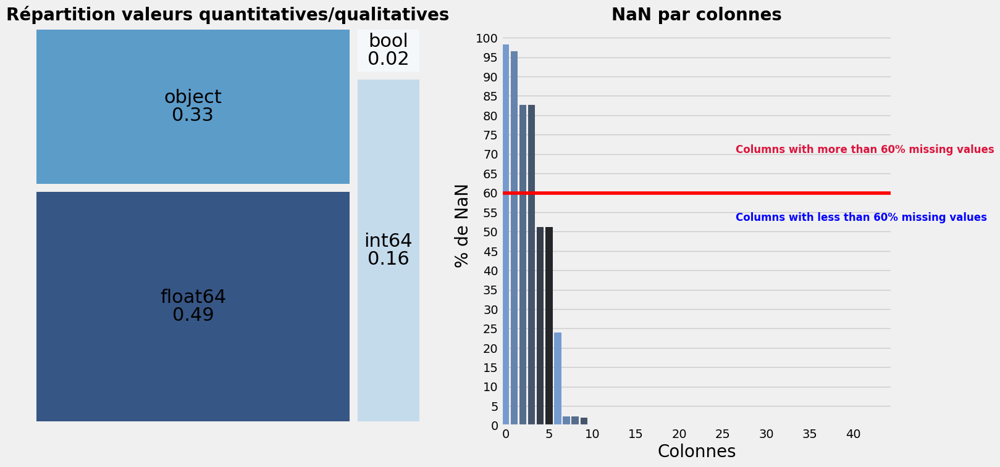

In [6]:
ex.analyse_forme(train, all=True)

In [34]:
train.head()

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),TotalGHGEmissions,GHGEmissionsIntensity,DefaultData,ComplianceStatus,Outlier,Latitude,Longitude,Address,City,State,ZipCode
0,27081,2015,Multifamily MR (5-9),Residence/Hotel/Senior Care/Housing,SOUNDVIEW,3902100225,1,SOUTHWEST,2001,1.0,6.0,108066,32436,75630,"Multifamily Housing, Retail Store",Multifamily Housing,71549.0,Retail Store,4081.0,NaN,NaN,NaN,NaN,27.500000,29.500000,86.200000,92.500000,2.076506e+06,2.228807e+06,0.0,6.085890e+05,2076592.0,0.000000,0.0,14.48,0.05,False,Compliant,NaN,47.558450,-122.387198,4815 CALIFORNIA AVE SW,SEATTLE,WA,98116.0
1,19519,2016,Multifamily MR (5-9),Residence/Hotel/Senior Care/Housing,Asia Condo HOA,0086000000,2,DOWNTOWN,2002,1.0,7.0,66849,0,66849,Multifamily Housing,Multifamily Housing,66849.0,NaN,NaN,NaN,NaN,NaN,NaN,28.400000,29.500000,89.199997,92.599998,1.898210e+06,1.972025e+06,0.0,5.563335e+05,1898210.0,0.000000,0.0,13.23,0.20,False,Compliant,NaN,47.596960,-122.324120,668 S Lane St,Seattle,WA,98104.0
2,2,2015,NonResidential,Residence/Hotel/Senior Care/Housing,PARAMOUNT HOTEL,659000220,7,DOWNTOWN,1996,1.0,11.0,103566,15064,88502,"Hotel, Parking, Restaurant",Hotel,83880.0,Parking,15064.0,Restaurant,4622.0,NaN,51.0,94.400000,99.000000,191.300000,195.200000,8.354235e+06,8.765788e+06,0.0,1.144563e+06,3905411.0,44490.000000,4448985.0,263.51,2.38,False,Compliant,NaN,47.613106,-122.333358,724 PINE ST,SEATTLE,WA,98101.0
3,25547,2016,Multifamily MR (5-9),Residence/Hotel/Senior Care/Housing,OK Hotel,5247800090,7,DOWNTOWN,1914,1.0,5.0,42534,0,42534,"Multifamily Housing, Parking",Multifamily Housing,25341.0,Parking,0.0,NaN,NaN,NaN,84.0,69.599998,72.300003,138.500000,141.300003,1.764410e+06,1.832173e+06,0.0,2.324767e+05,793211.0,9711.990234,971199.0,57.11,1.34,False,Compliant,NaN,47.600380,-122.335170,212 Alaskan Way S,Seattle,WA,98104.0
4,25479,2016,Multifamily LR (1-4),Residence/Hotel/Senior Care/Housing,Ravenna,7170600000,4,NORTHEAST,1978,1.0,3.0,20390,0,20390,Multifamily Housing,Multifamily Housing,20390.0,NaN,NaN,NaN,NaN,NaN,NaN,24.200001,26.200001,75.800003,82.400002,4.924219e+05,5.351643e+05,0.0,1.443206e+05,492422.0,0.000000,0.0,3.43,0.17,False,Compliant,NaN,47.667680,-122.303700,2211 NE 54th St,Seattle,WA,98105.0


J'ai de nombreuses colonnes avec peu de NaNs et 6 colonnes à plus de 50% de NaNs.

In [35]:
train.columns[train.isnull().sum()/train.shape[0] > 0.5]

Index(['SecondLargestPropertyUseType', 'SecondLargestPropertyUseTypeGFA',
       'ThirdLargestPropertyUseType', 'ThirdLargestPropertyUseTypeGFA',
       'YearsENERGYSTARCertified', 'Outlier'],
      dtype='object')

Je repère mes 3 variables primordiales :
- ENERGYSTARScore,
- TotalGHGEmissions,
- SiteEnergyUse(kBtu)


In [36]:
train[['ENERGYSTARScore','TotalGHGEmissions','SiteEnergyUse(kBtu)']].isnull().sum()/train.shape[0]

ENERGYSTARScore        0.239428
TotalGHGEmissions      0.002779
SiteEnergyUse(kBtu)    0.002184
dtype: float64

## Analyse du fond

Je cherche ici à:
- Visualiser mes targets
- Comprendre mes différentes variables
- Analyser mes relations features - target et déterminer les variables trop ou pas du tout corrélées
- Identifier les outliers

### Visualisation des targets

Nb de bins optimal estimé: 28


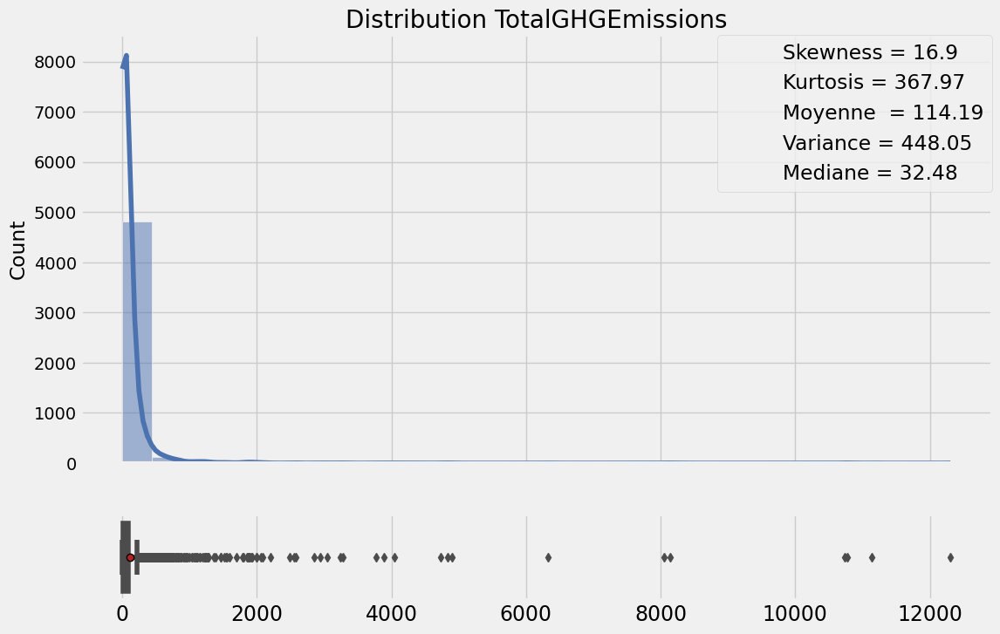

In [37]:
ex.mesure_forme(train,'TotalGHGEmissions')

Nb de bins optimal estimé: 29


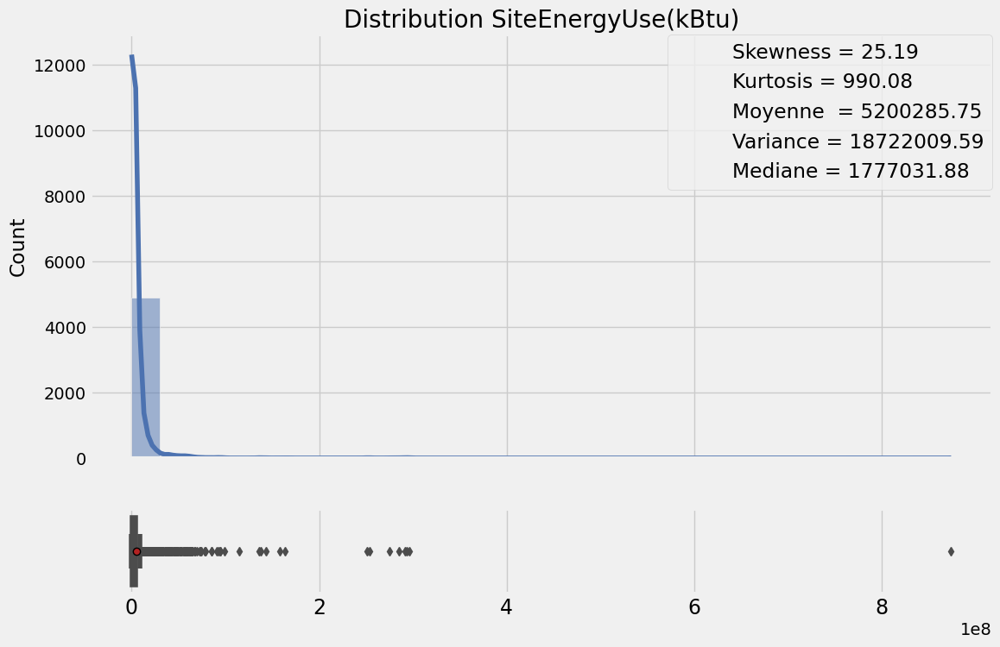

In [38]:
ex.mesure_forme(train,'SiteEnergyUse(kBtu)')

Mes distributions sont complétement asymétriques, je les passe au log.

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1781: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item_labels[indexer[info_axis]]] = value


Nb de bins optimal estimé: 28


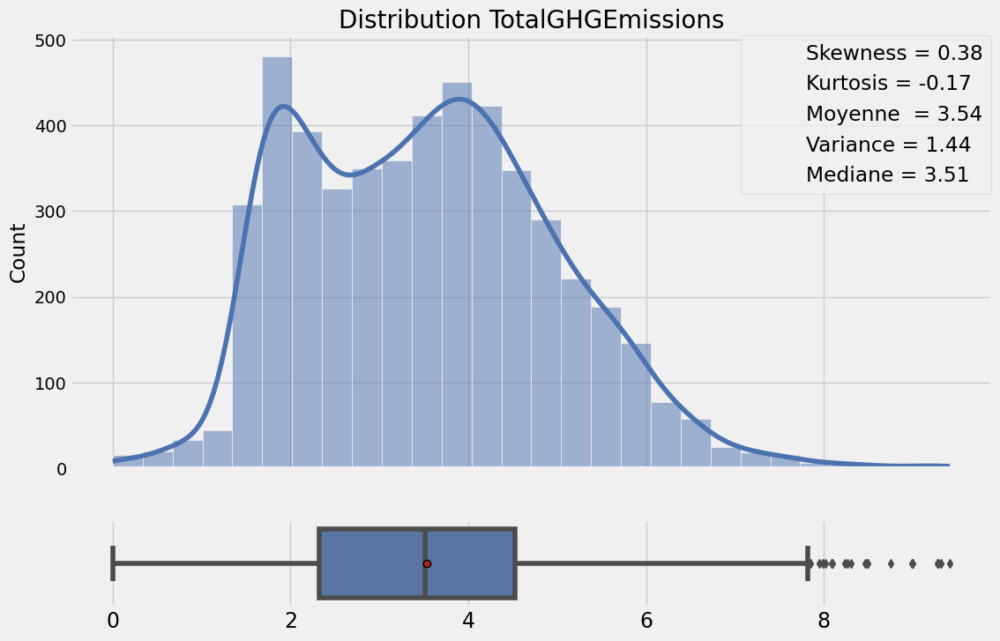

In [39]:
tmp = train[['SiteEnergyUse(kBtu)', 'TotalGHGEmissions']]
tmp.loc[:,'TotalGHGEmissions'] = np.log(1+tmp.loc[:,'TotalGHGEmissions'])
tmp.loc[:,'SiteEnergyUse(kBtu)'] = np.log(1+tmp.loc[:,'SiteEnergyUse(kBtu)'])

ex.mesure_forme(tmp,'TotalGHGEmissions')

Nb de bins optimal estimé: 29


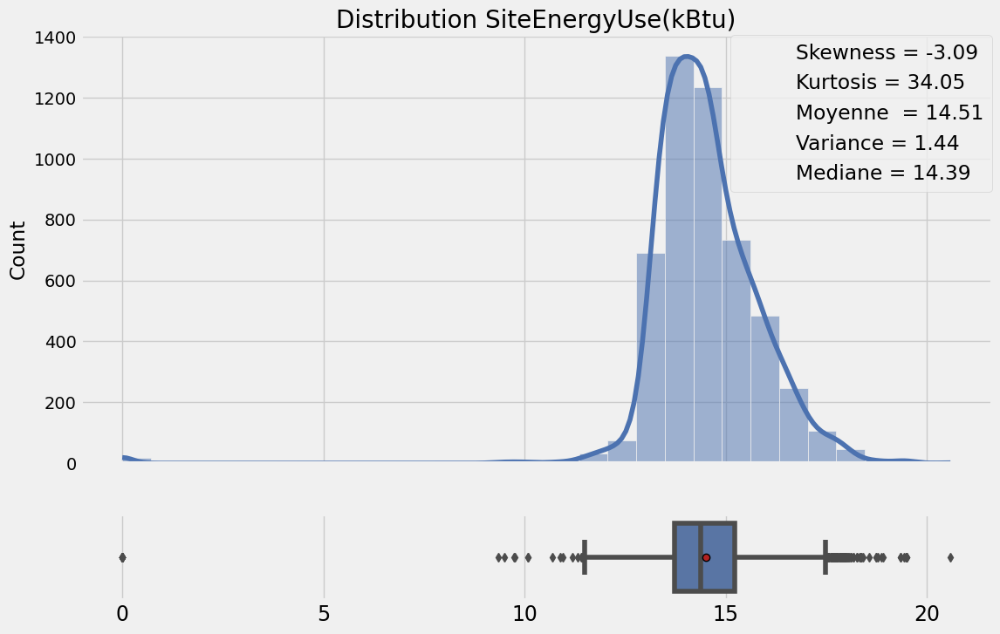

In [40]:
ex.mesure_forme(tmp,'SiteEnergyUse(kBtu)')

### Variables quantitatives

Nb de bins optimal estimé: 27


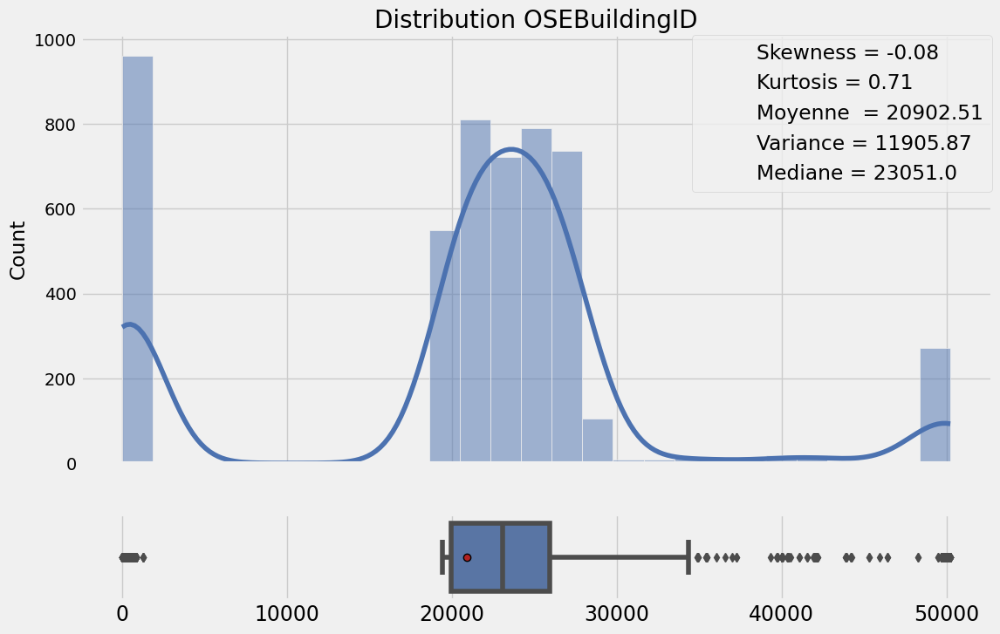

Nb de bins optimal estimé: 3


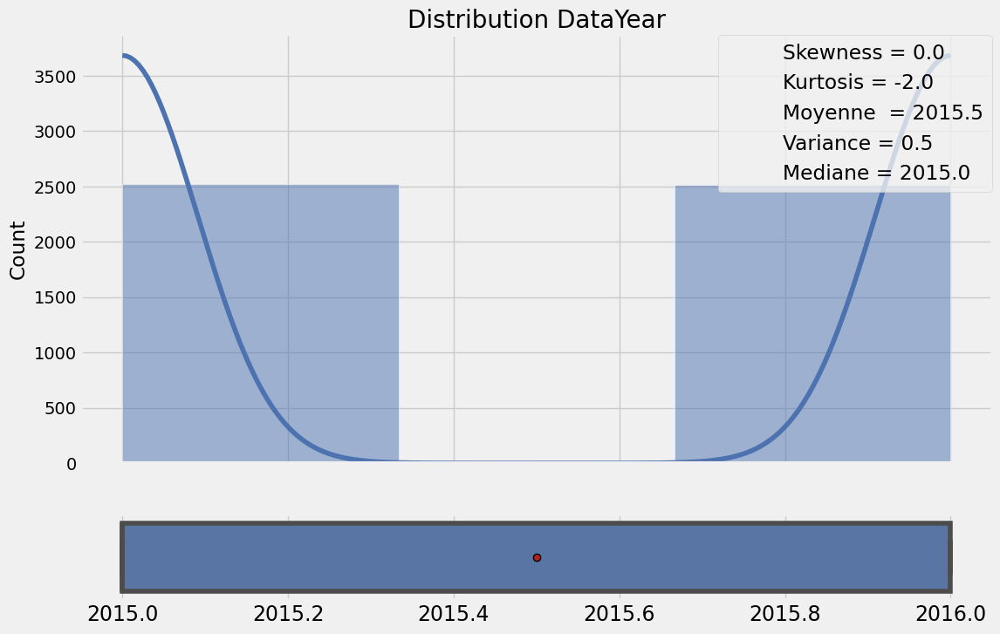

Nb de bins optimal estimé: 7


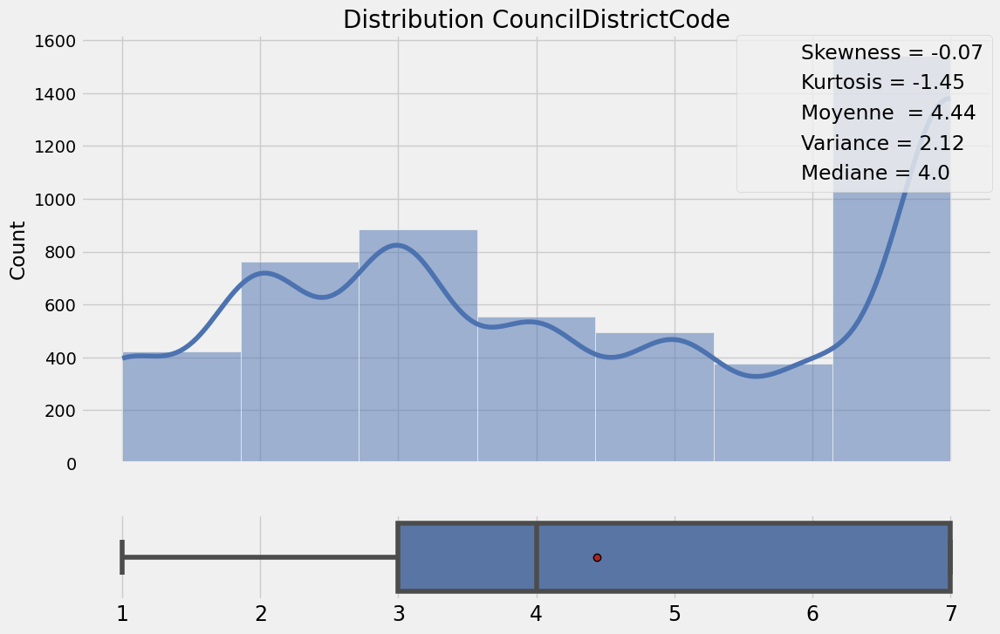

Nb de bins optimal estimé: 16


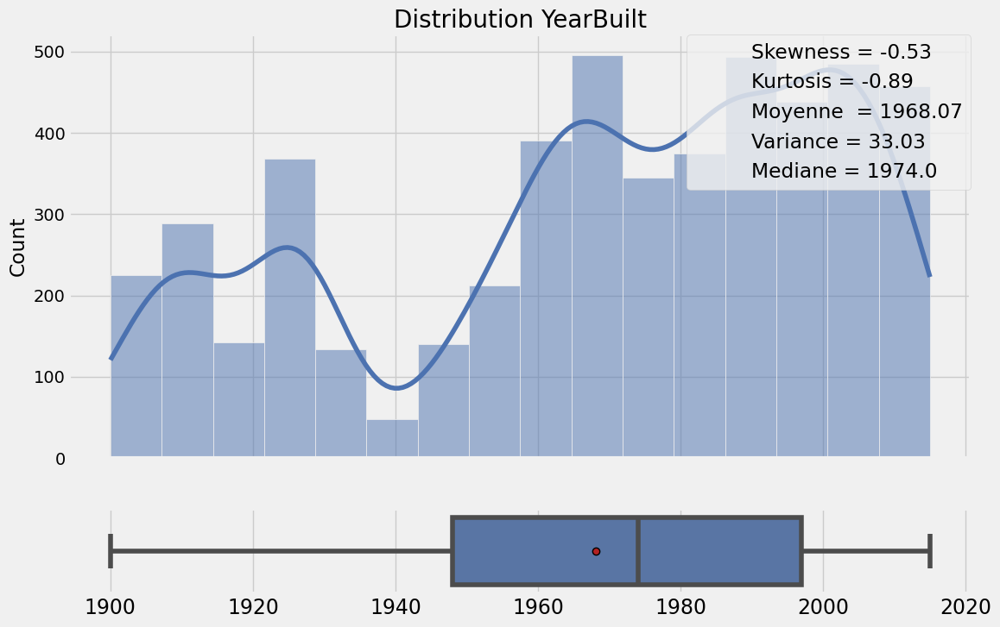

Nb de bins optimal estimé: 9


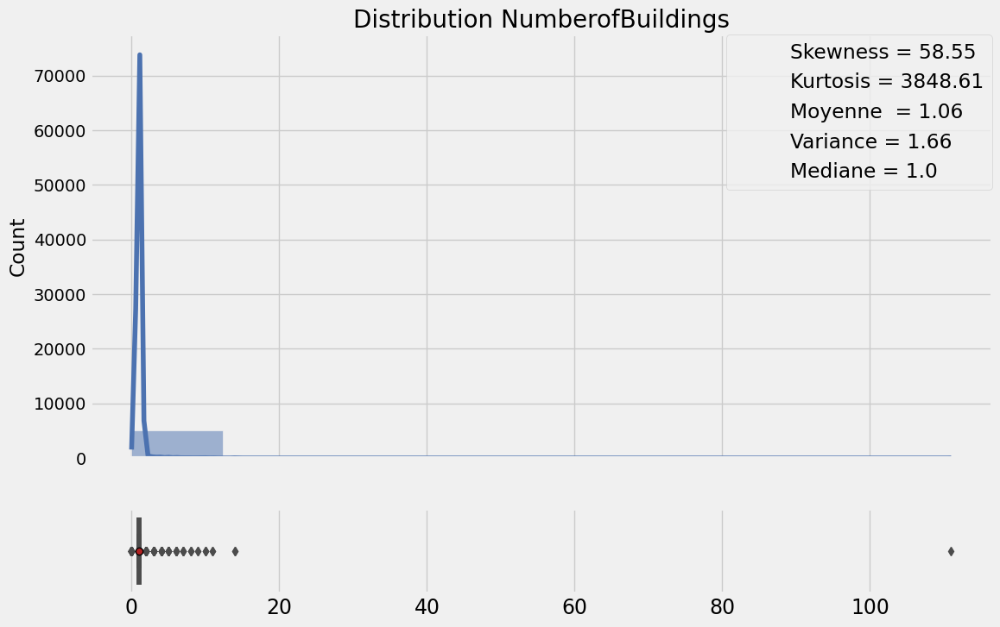

Nb de bins optimal estimé: 13


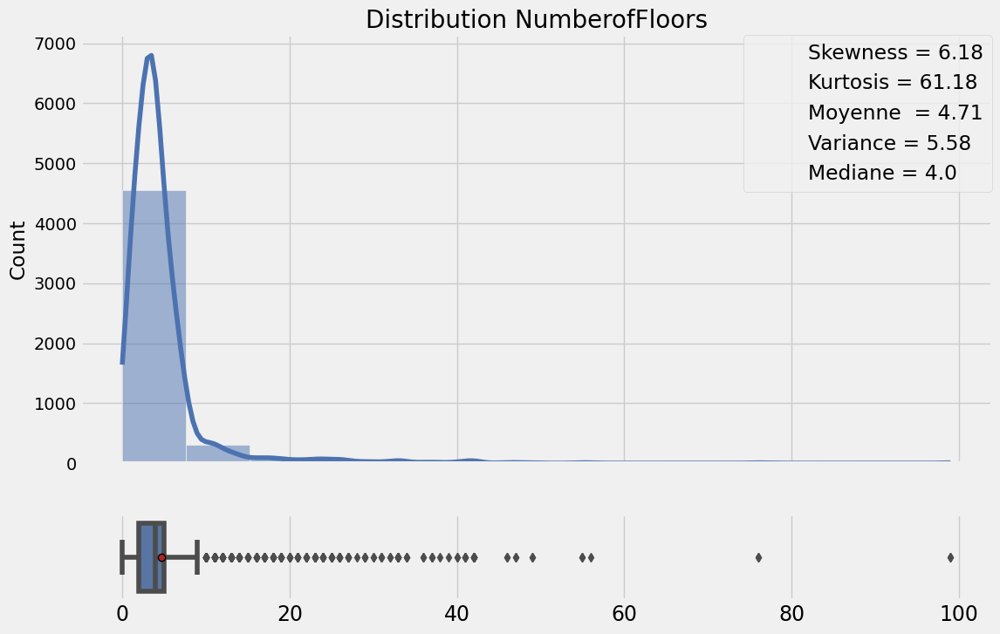

Nb de bins optimal estimé: 27


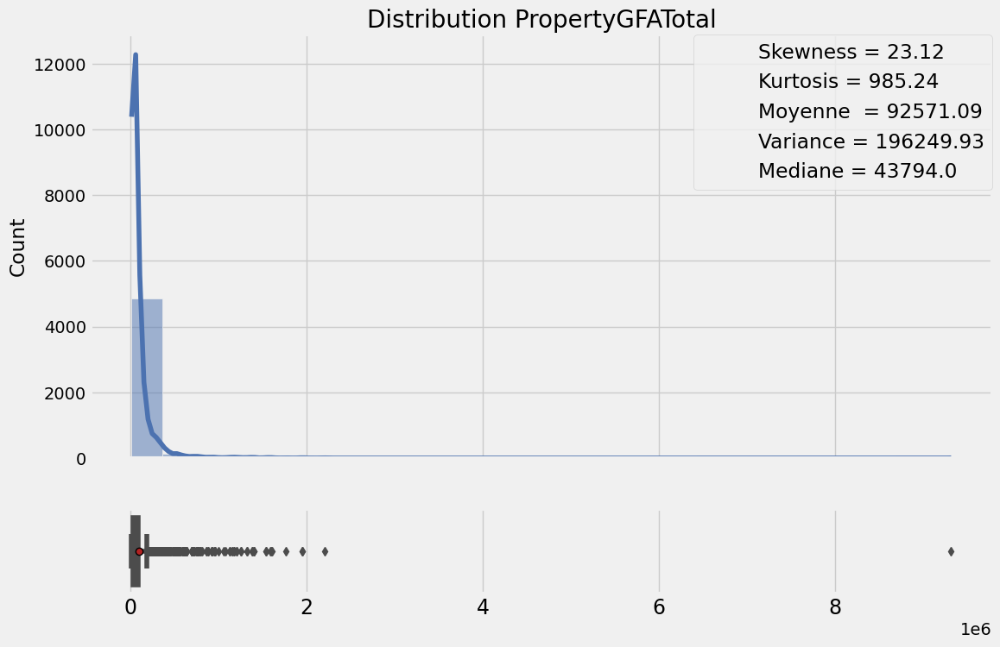

Nb de bins optimal estimé: 23


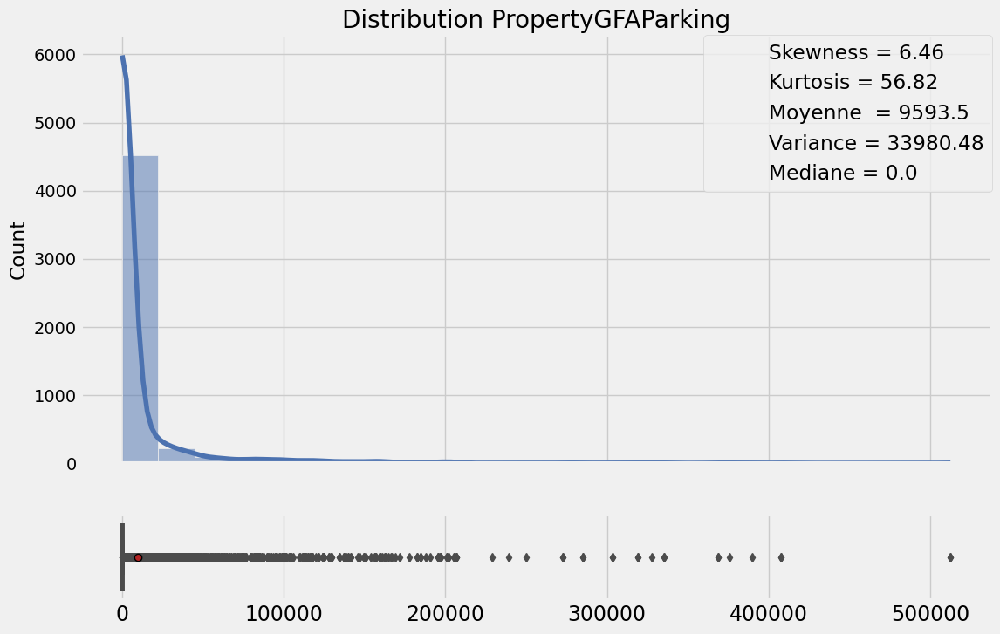

Nb de bins optimal estimé: 27


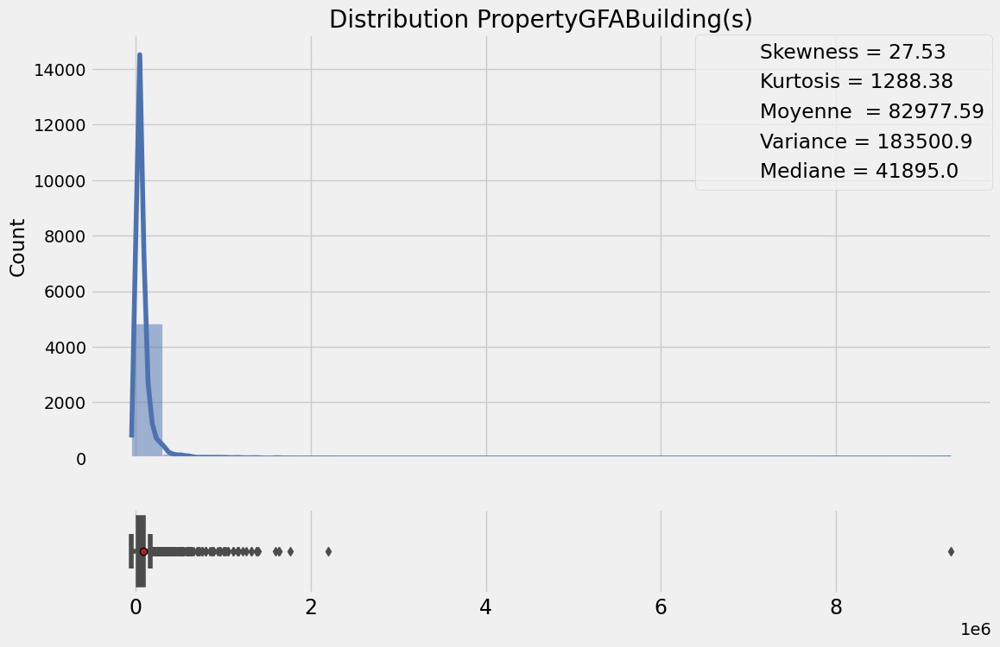

Nb de bins optimal estimé: 27


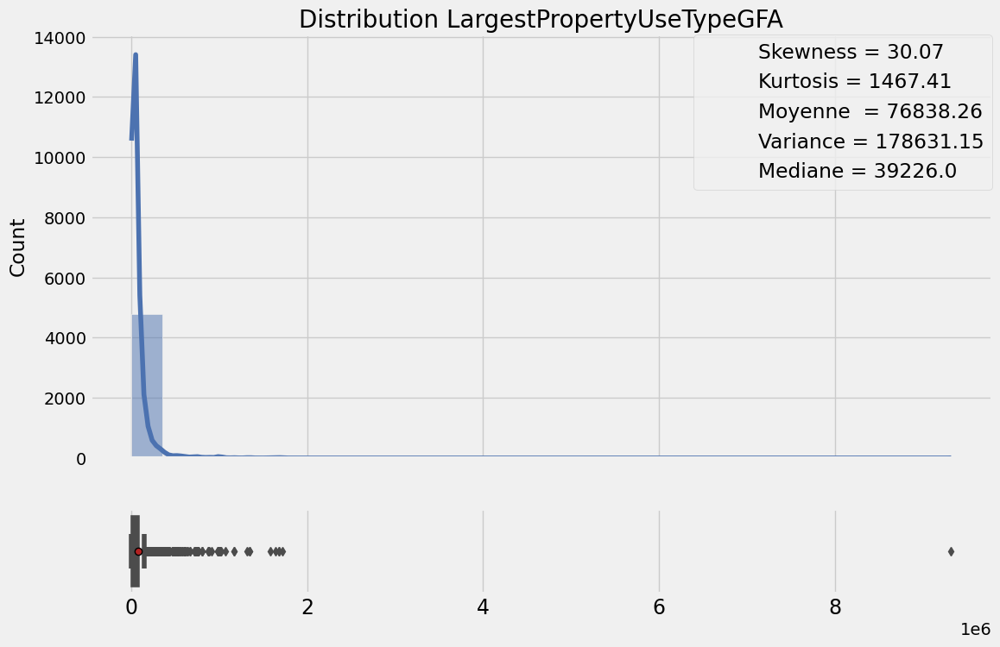

Nb de bins optimal estimé: 24


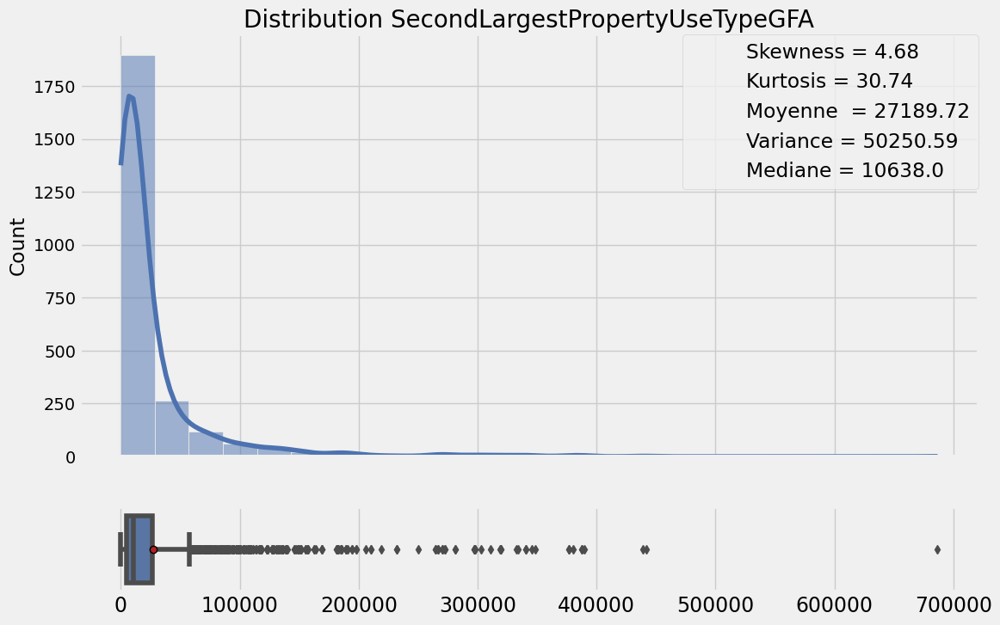

Nb de bins optimal estimé: 21


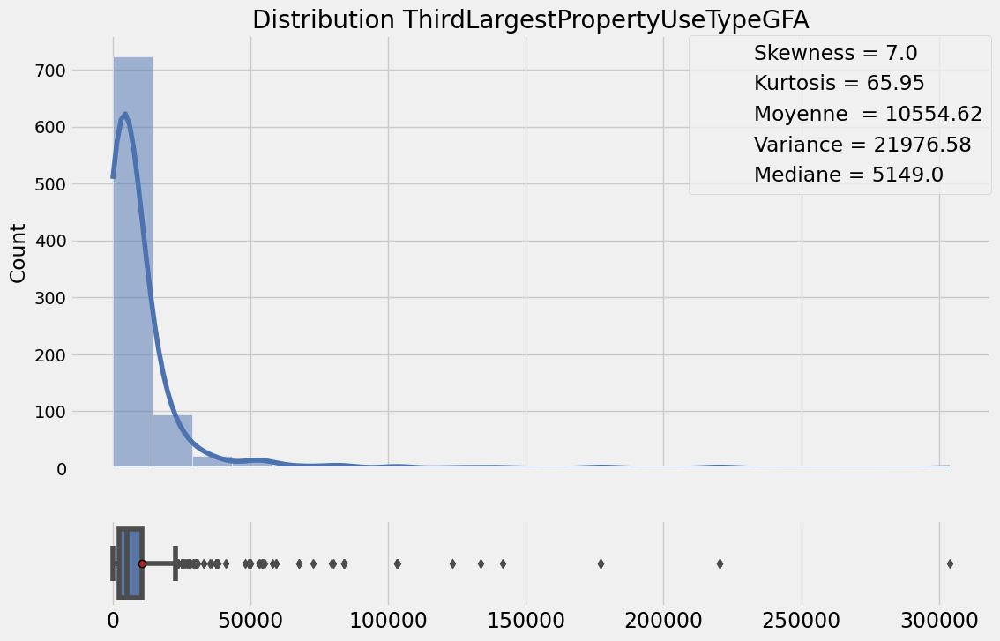

Nb de bins optimal estimé: 16


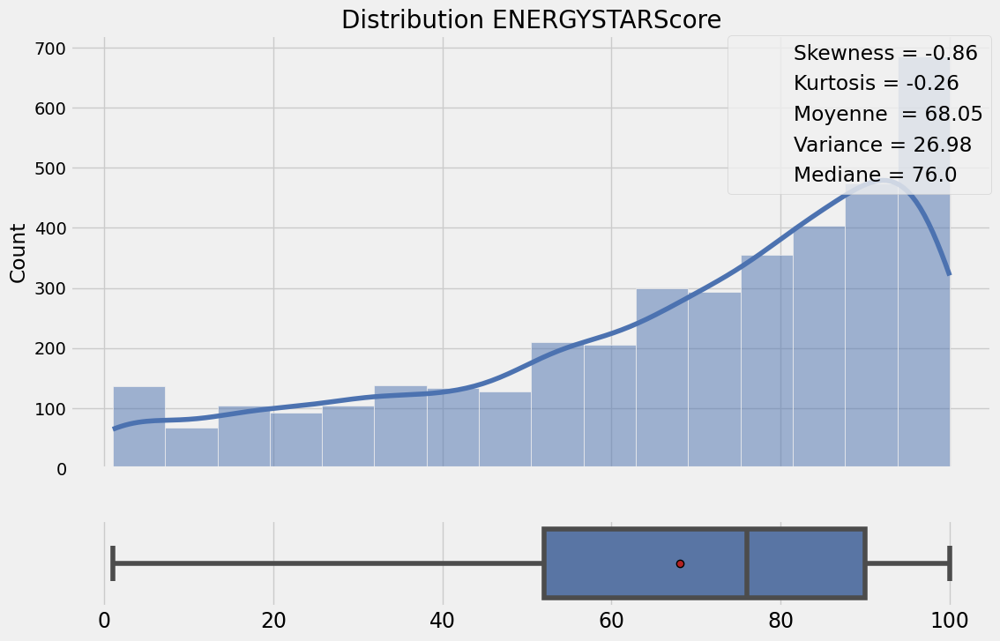

Nb de bins optimal estimé: 25


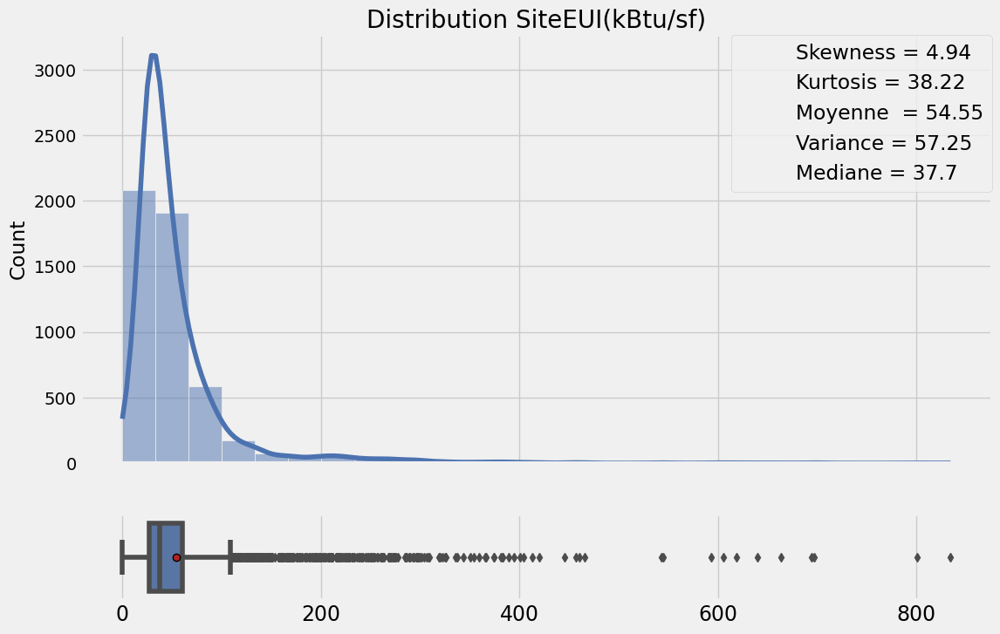

Nb de bins optimal estimé: 25


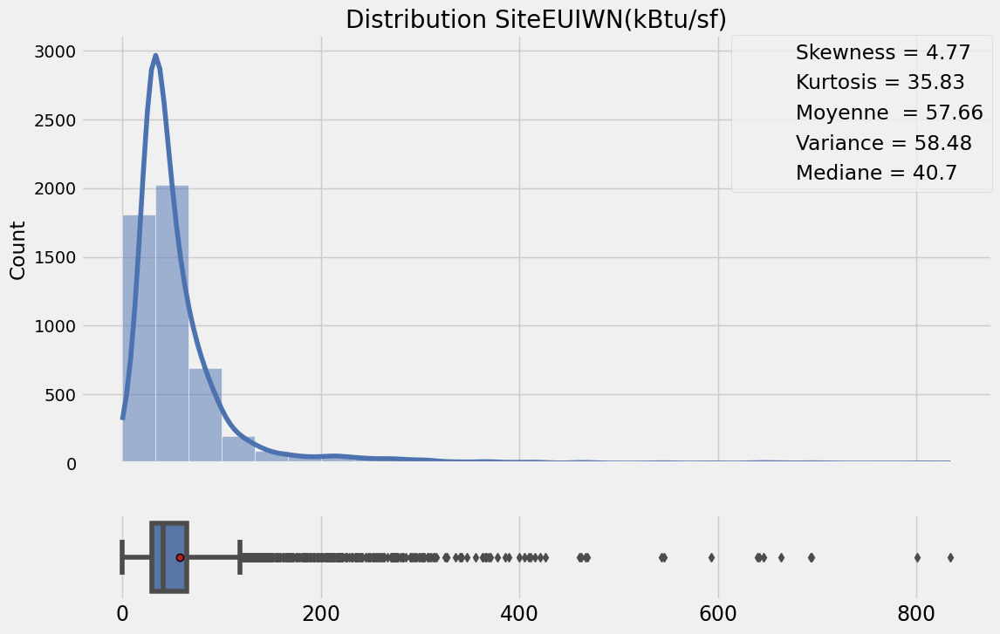

Nb de bins optimal estimé: 27


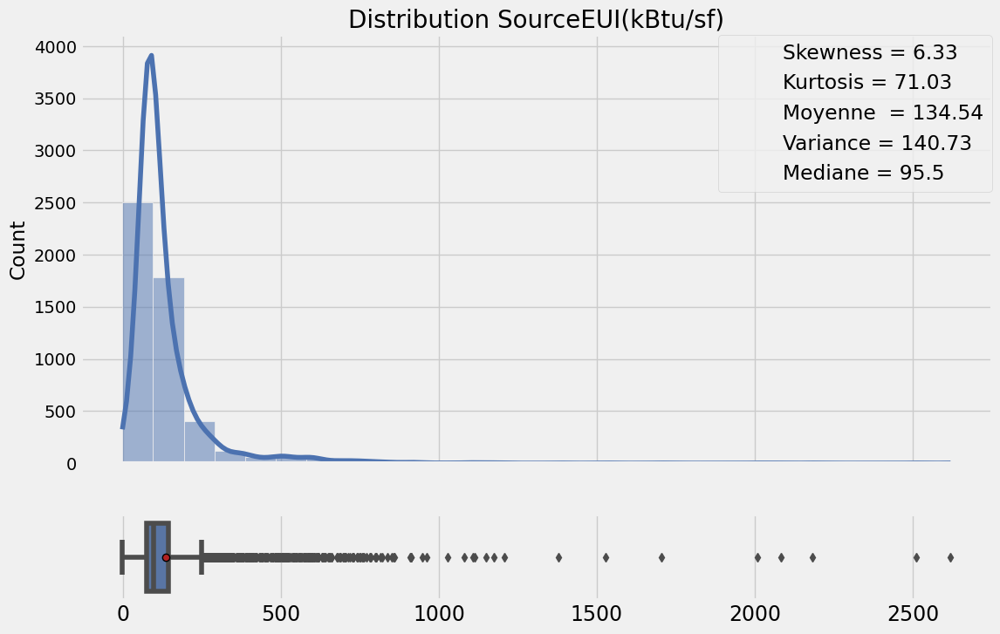

Nb de bins optimal estimé: 27


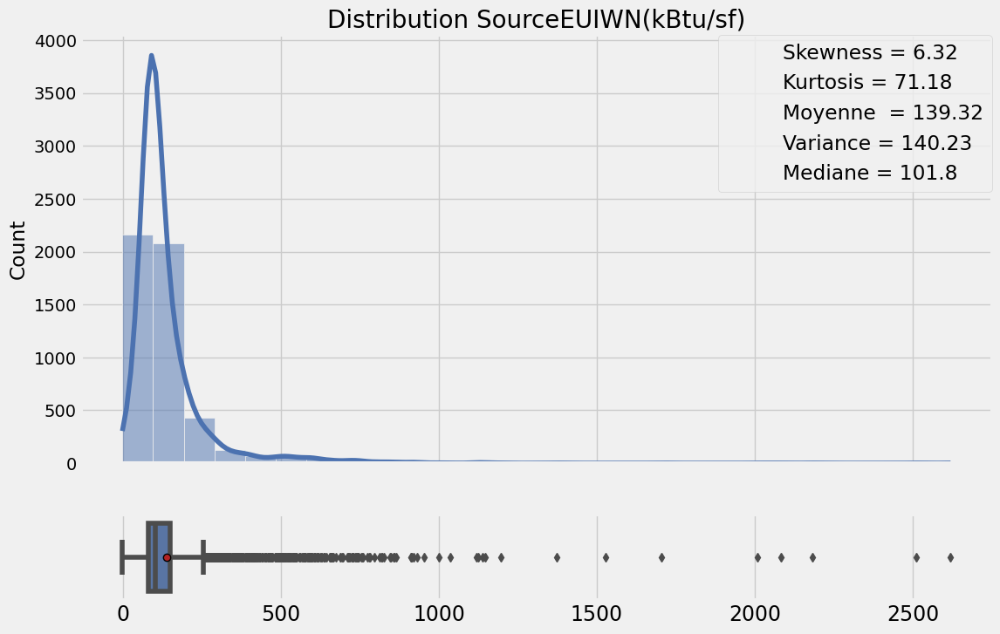

Nb de bins optimal estimé: 29


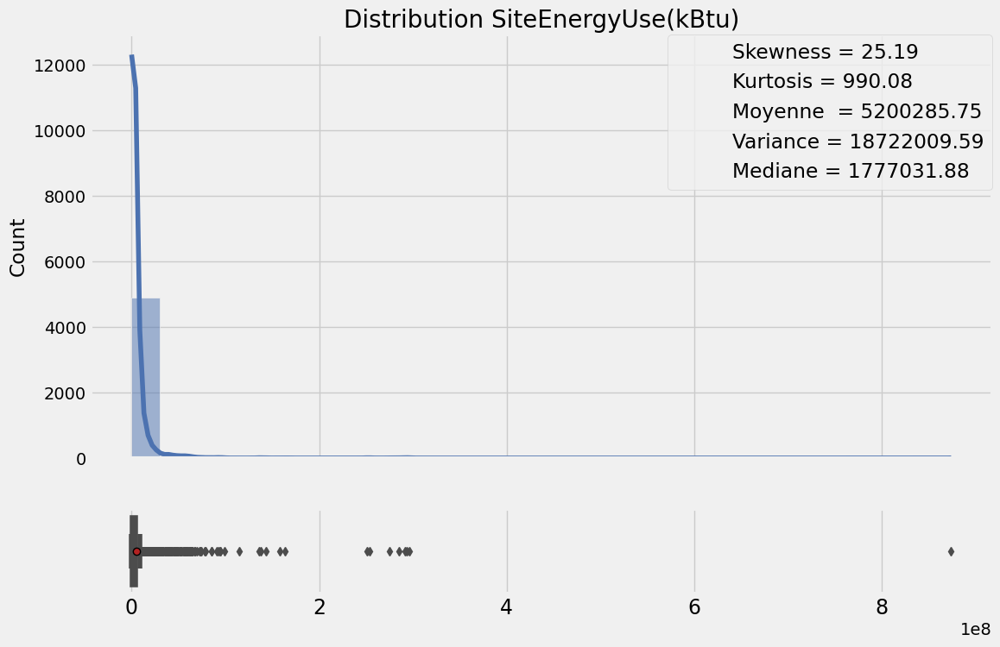

Nb de bins optimal estimé: 29


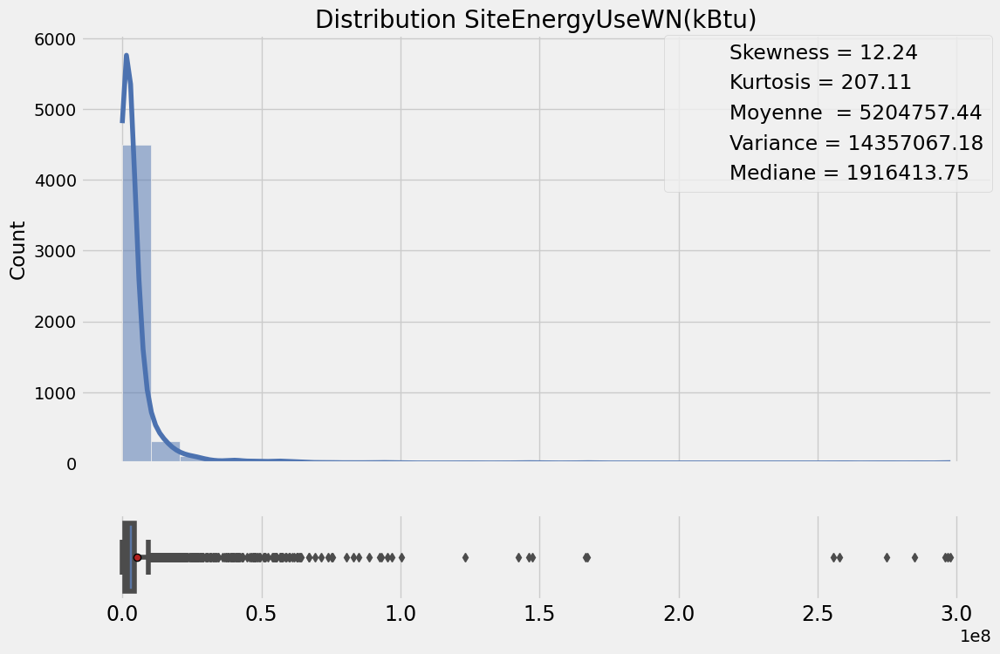

Nb de bins optimal estimé: 18


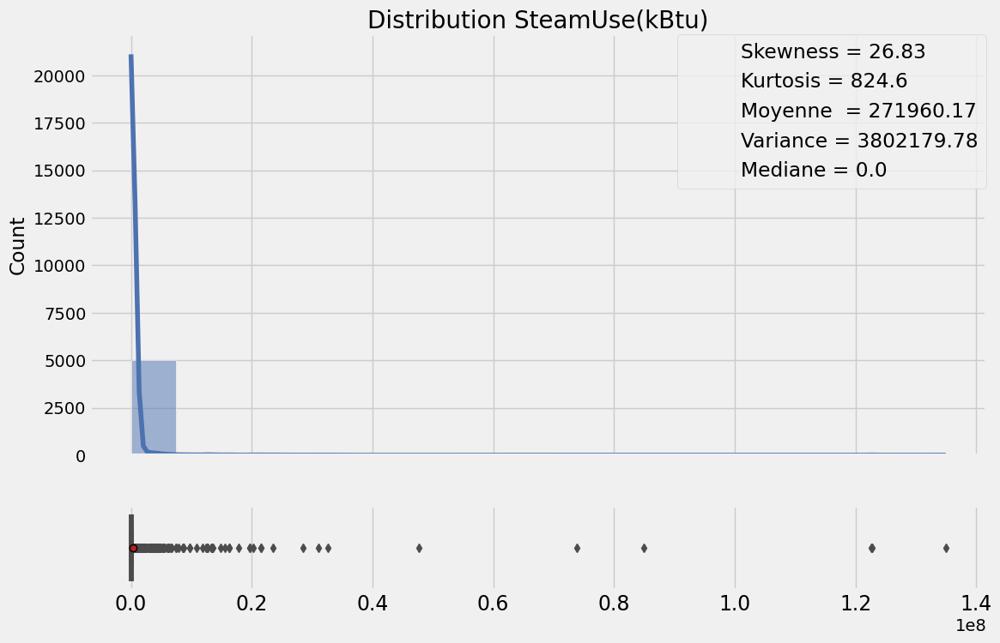

Nb de bins optimal estimé: 29


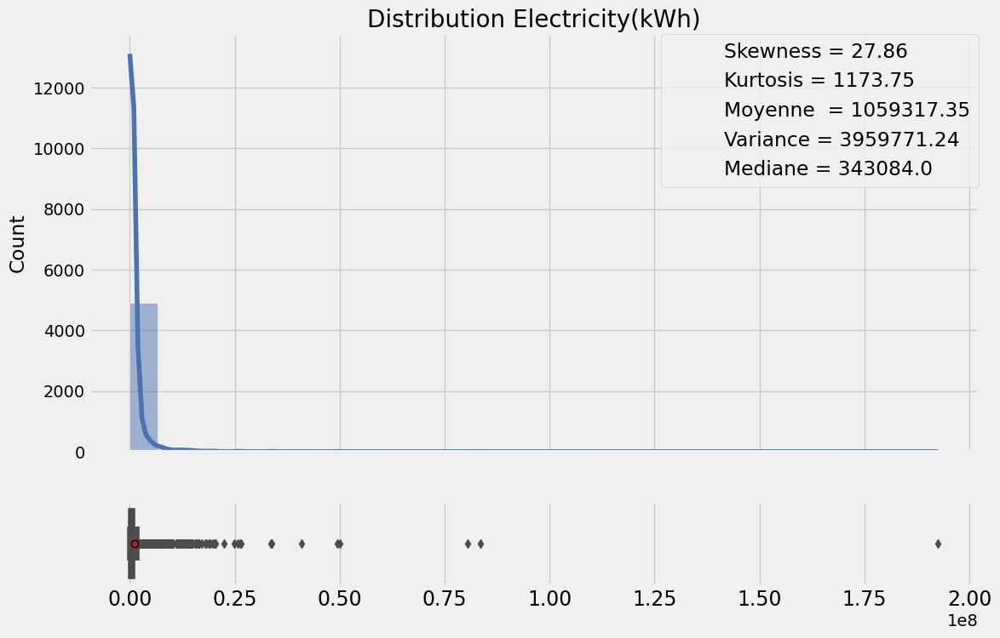

Nb de bins optimal estimé: 29


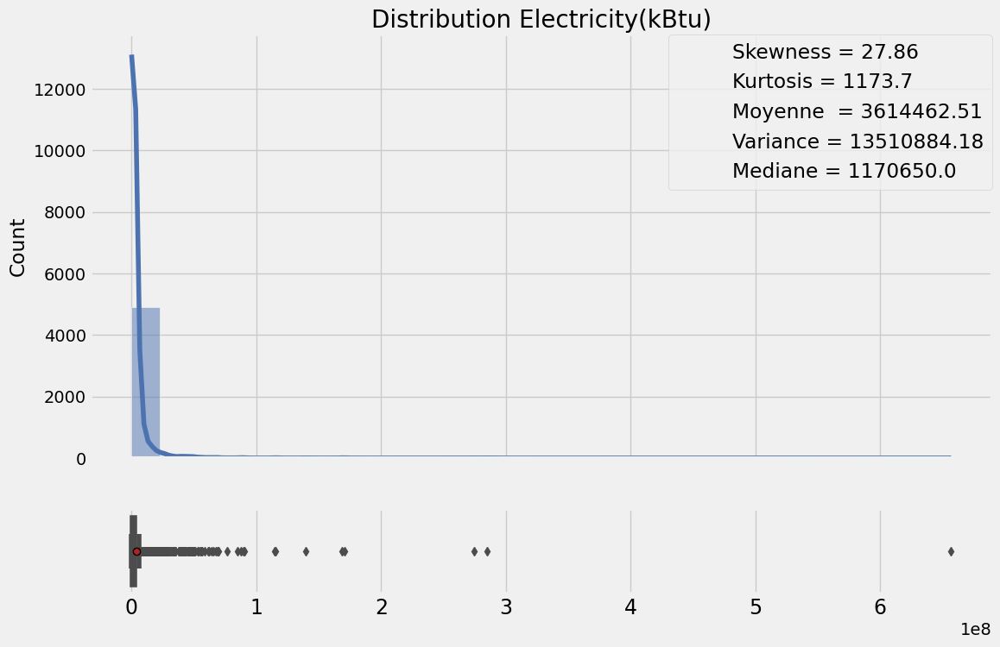

Nb de bins optimal estimé: 27


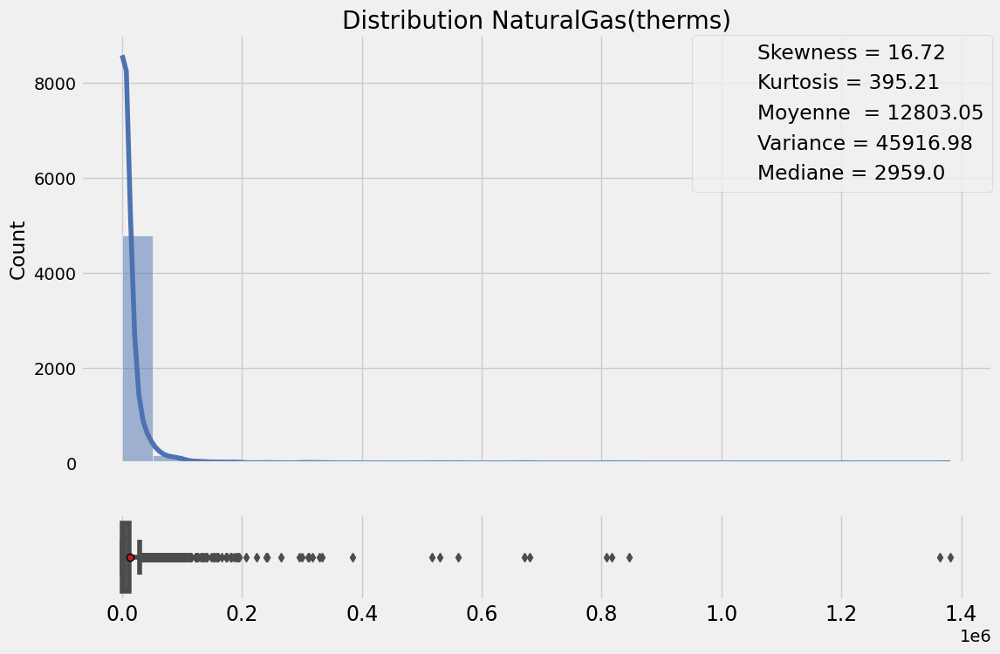

Nb de bins optimal estimé: 27


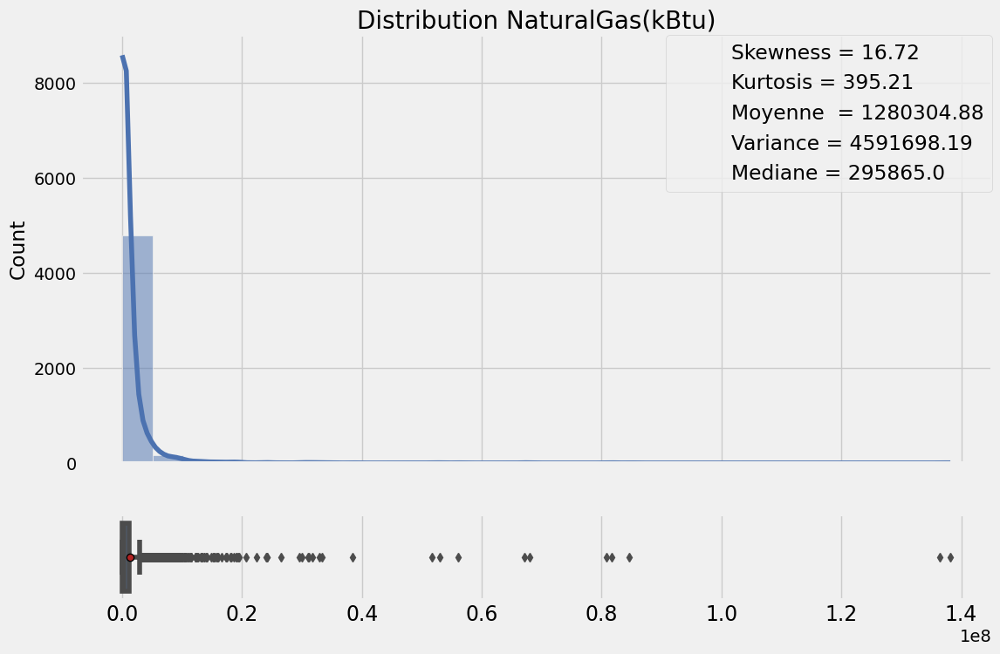

Nb de bins optimal estimé: 28


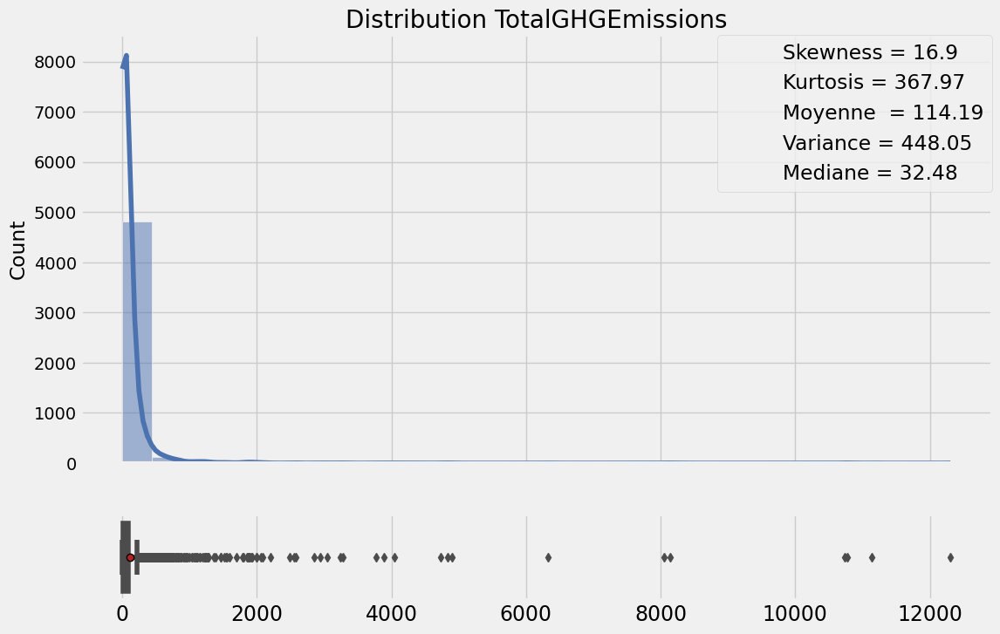

Nb de bins optimal estimé: 22


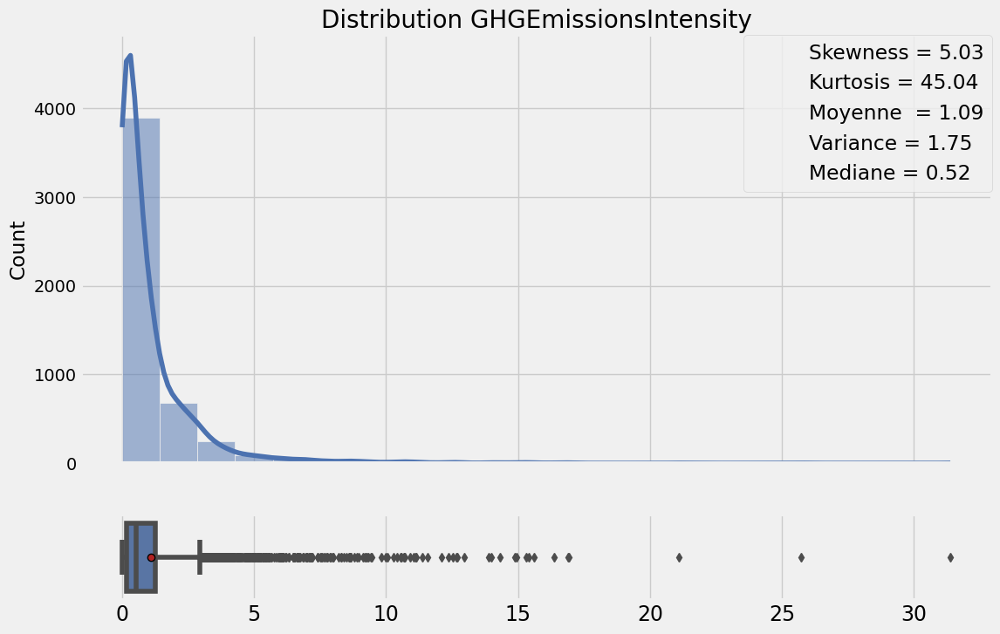

Nb de bins optimal estimé: 29


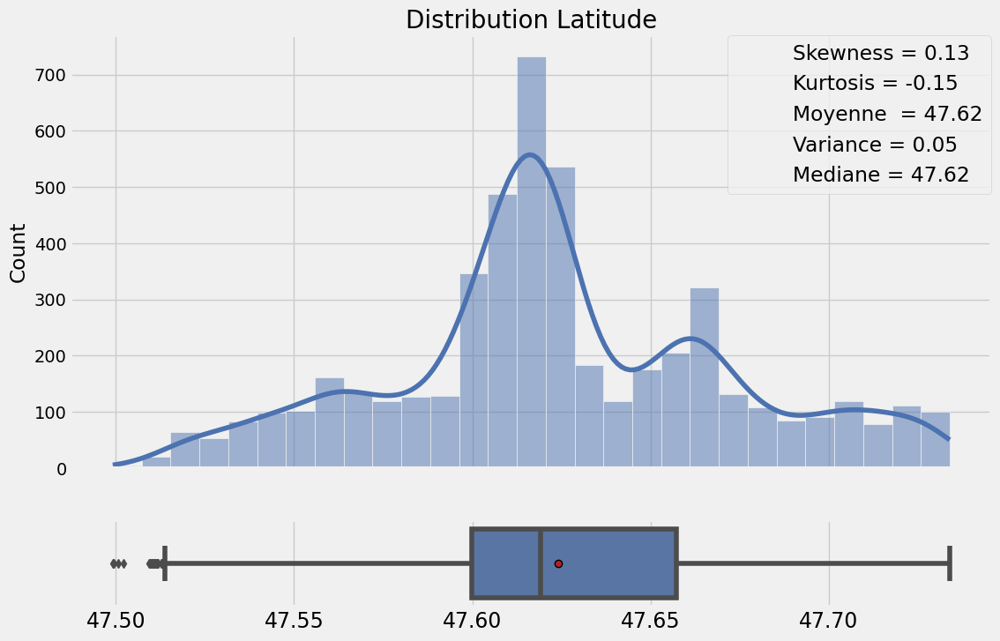

Nb de bins optimal estimé: 28


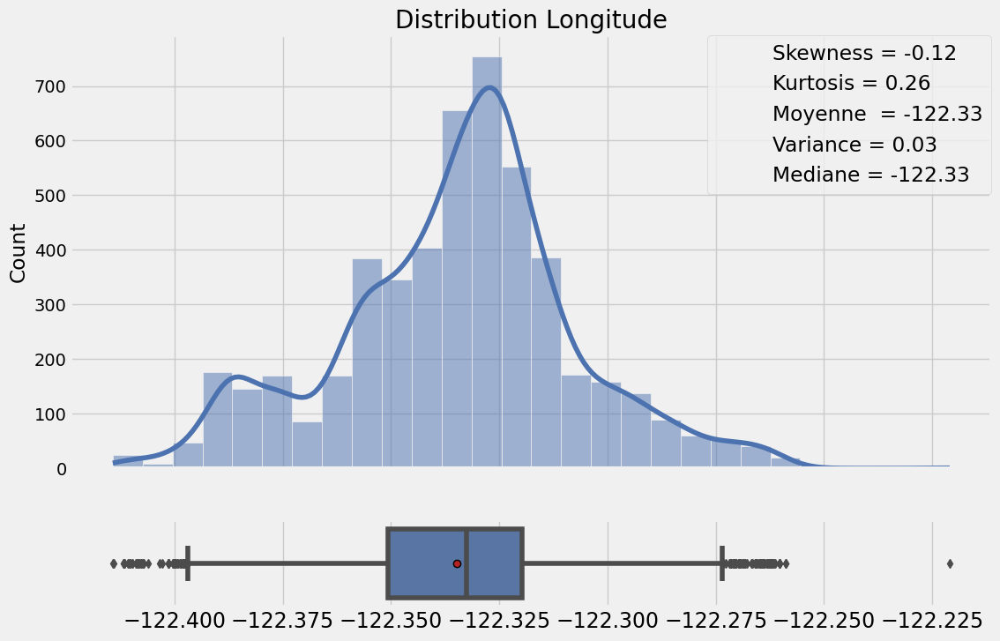

Nb de bins optimal estimé: 14


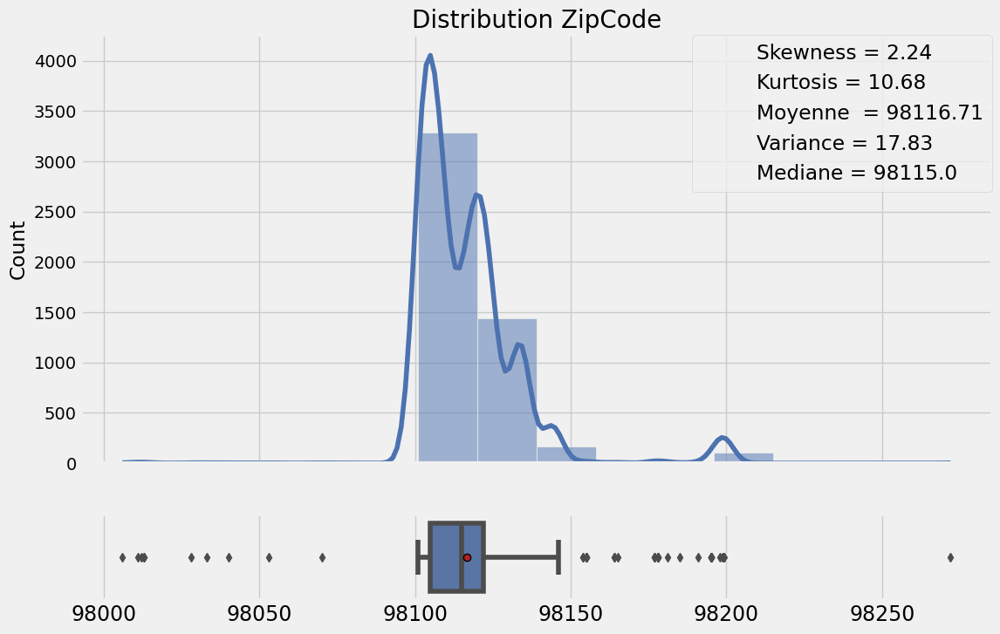

In [41]:
for col in train.select_dtypes(exclude=['object', 'bool']):
    ex.mesure_forme(train,col)

On remarque en étudiant la distribution de nos données quantitatives que la grande majorité ont un étalement vers la droite (skewness > 0).

-----

Je cherche à savoir si certaines de mes variables ne sont pas redondantes (particulièrement celles liées à l'énergie). <br>
WN = Weather Normalized, il s'agit d'une mesure normalisée sur 30 ans pour éviter que les résultats soient fortement biaisés par la météo de l'année de mesure.

SiteEUI = *annual amount of all the energy consumed by the property on-site, as reported on utility bills.*<br>
SourceEUI = *annual energy used to operate the property, including losses from generation, transmission, & distribution.* <br>
SiteEnergyUse = *annual amount of energy consumed by the property from all sources of energy*


Text(0.5, 1.0, "Matrice de corrélation entre variables liées à l'énergie")

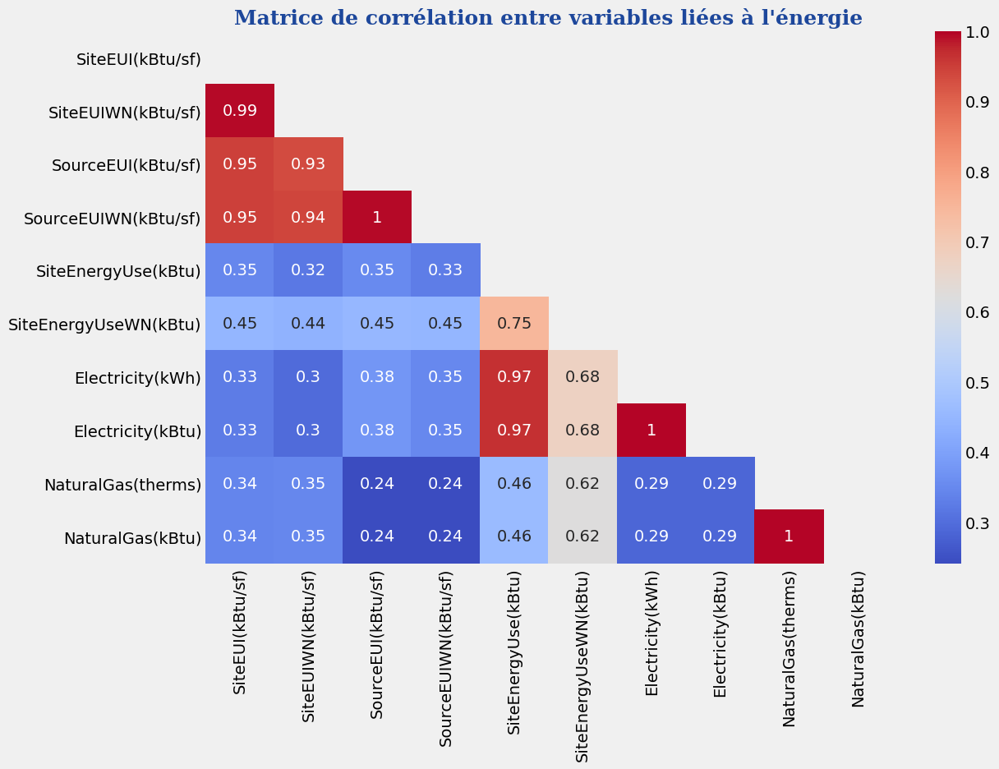

In [42]:
plt.figure(figsize=(12,8))

corr_matrix = train[['SiteEUI(kBtu/sf)',
          'SiteEUIWN(kBtu/sf)',
          'SourceEUI(kBtu/sf)',
          'SourceEUIWN(kBtu/sf)', 
          'SiteEnergyUse(kBtu)',
          'SiteEnergyUseWN(kBtu)',
          'Electricity(kWh)',
          'Electricity(kBtu)',
          'NaturalGas(therms)',
          'NaturalGas(kBtu)',]].corr()

# Generate a mask for the upper triangle
mask = np.zeros_like(corr_matrix)
mask[np.triu_indices_from(mask)] = True

sns.heatmap(data = corr_matrix, 
            cmap='coolwarm', annot=True, mask=mask)
plt.title('Matrice de corrélation entre variables liées à l\'énergie', fontdict=font_title)

Il y a une redondance entre pas mal de ces variables, je conserverai les unités en kBtu et exploiterai kBtu pour faire du Feature Engineering.

**Data Leakage**

Je cherche mes colonnes pouvant potentiellement provoquer du data leakage. <br>
Je cherche donc à repérer les variables avec une corrélation/anti-corrélation très forte avec ma target. <br>

In [43]:
train.corr().loc[['SiteEnergyUse(kBtu)','TotalGHGEmissions']].T

,SiteEnergyUse(kBtu),TotalGHGEmissions
OSEBuildingID,-0.143009,-0.114841
DataYear,0.012179,0.009842
CouncilDistrictCode,0.058452,0.038134
YearBuilt,0.033876,0.009948
NumberofBuildings,0.683097,0.421159
NumberofFloors,0.246513,0.169682
PropertyGFATotal,0.796763,0.571345
PropertyGFAParking,0.211363,0.129489
PropertyGFABuilding(s),0.812966,0.587050
LargestPropertyUseTypeGFA,0.834114,0.622594


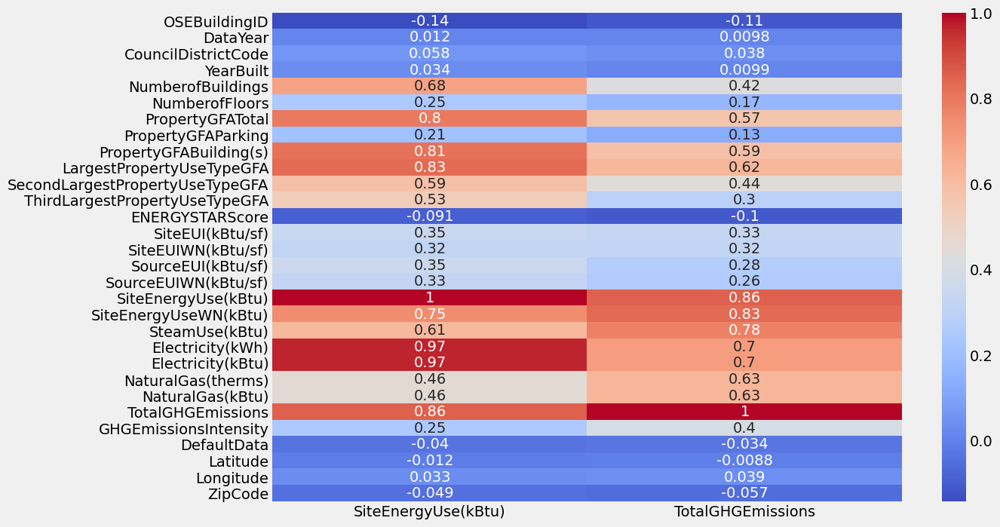

In [44]:
plt.figure(figsize=(12,8))
sns.heatmap(train.corr().loc[['SiteEnergyUse(kBtu)','TotalGHGEmissions']].T, cmap='coolwarm', annot=True)

Pour SiteEnergyUse(kBtu): <br>
Il semble y avoir une corrélation forte **(>0.8)** notable avec:
- Electricity(kWh), Electricity(kBtu), TotalGHGEmissions, LargestPropertyUseTypeGFA <br>

Il semble y avoir une corrélation moyennement forte **(>0.6 & <0.8)** notable avec: <br>
- SiteEnergyUseWN(kBtu), SecondLargestPropertyUseTypeGFA, ThirdLargestPropertyUseTypeGFA, NumberOfBuildings, SteamUse(kBtu), PropertyGFABuilding(s), PropertyGFATotal

Pour TotalGHGEmissions: <br>
Il semble y avoir une corrélation forte **(>0.8)** notable avec:
-  SiteEnergyUseWN(kBtu), SiteEnergyUse(kBtu)<br>

Il semble y avoir une corrélation moyennement forte **(>0.6 & <0.8)** notable avec: <br>
- NaturalGas(kBtu), NaturalGas(therms), Electricity, SteamUse, ThirdLargestPropertyUseTypeGFA

Il apparait alors évident que SiteEnergyUse(kBtu), SiteEnergyUseWN(kBtu), Electricity(kWh), Electricity(kBtu), TotalGHGEmissions sont des variables qui provoqueront un data leakage. <br>
**Je ne les incluerai pas dans mon train set mais m'en servirai plus tard pour faire du feature engineering.**

**Présence de NaNs**

In [45]:
train.select_dtypes(exclude='object').isnull().sum()/train.shape[0]

OSEBuildingID                      0.000000
DataYear                           0.000000
CouncilDistrictCode                0.000000
YearBuilt                          0.000000
NumberofBuildings                  0.001390
NumberofFloors                     0.001588
PropertyGFATotal                   0.000000
PropertyGFAParking                 0.000000
PropertyGFABuilding(s)             0.000000
LargestPropertyUseTypeGFA          0.022633
SecondLargestPropertyUseTypeGFA    0.511813
ThirdLargestPropertyUseTypeGFA     0.826285
ENERGYSTARScore                    0.239428
SiteEUI(kBtu/sf)                   0.002382
SiteEUIWN(kBtu/sf)                 0.002382
SourceEUI(kBtu/sf)                 0.002779
SourceEUIWN(kBtu/sf)               0.002779
SiteEnergyUse(kBtu)                0.002184
SiteEnergyUseWN(kBtu)              0.002382
SteamUse(kBtu)                     0.002779
Electricity(kWh)                   0.002779
Electricity(kBtu)                  0.002779
NaturalGas(therms)              

**Variable non présentes sur le permis de construire**

Il est aussi notable que certaines valeurs ont pu être relevées car le batiment a été construit, je pars du principe que l'on cherche à estimer les émissions de GHG et d'energie avant la construction. <br>
Donc pour mon train set je ne garderai que les colonnes présentes sur le permis de construire. <br>

Cela m'élimine toutes mes variables liées à la consommation d'électricité annuelle et à l'émission de gazs de toutes formes. <br>

### Variables qualitatives

In [46]:
train.columns[train.dtypes == 'object']

Index(['BuildingType', 'PrimaryPropertyType', 'PropertyName',
       'TaxParcelIdentificationNumber', 'Neighborhood',
       'ListOfAllPropertyUseTypes', 'LargestPropertyUseType',
       'SecondLargestPropertyUseType', 'ThirdLargestPropertyUseType',
       'YearsENERGYSTARCertified', 'ComplianceStatus', 'Outlier', 'Address',
       'City', 'State'],
      dtype='object')

Features non affichées ['PropertyName', 'TaxParcelIdentificationNumber', 'ListOfAllPropertyUseTypes', 'YearsENERGYSTARCertified', 'Address', 'State']


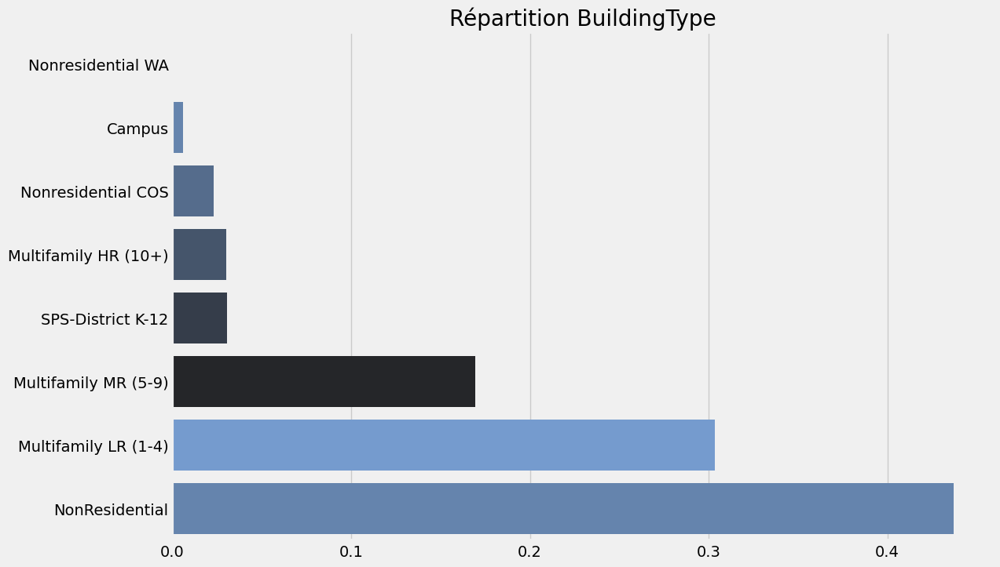

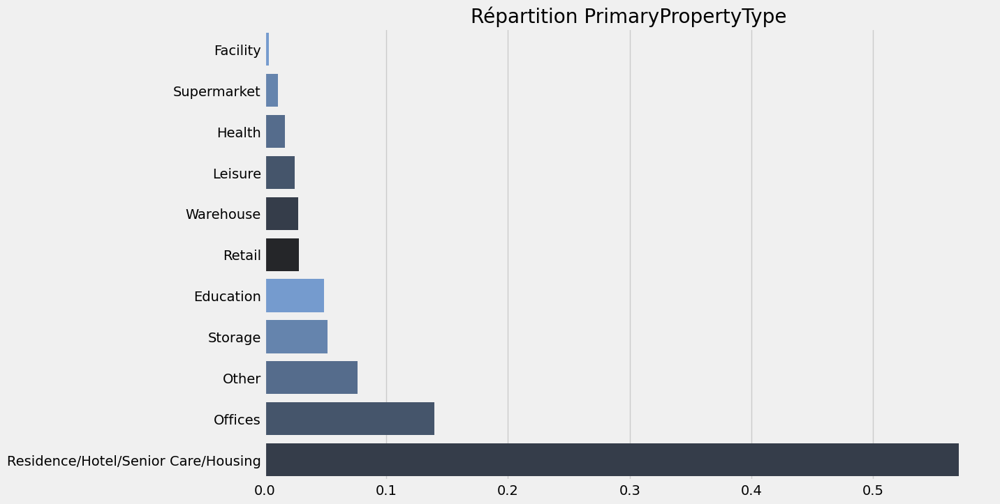

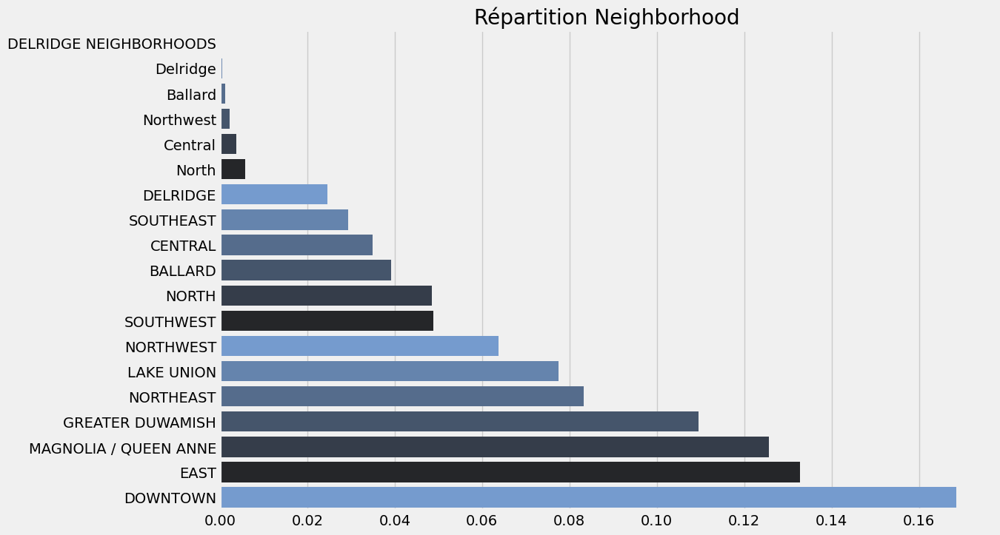

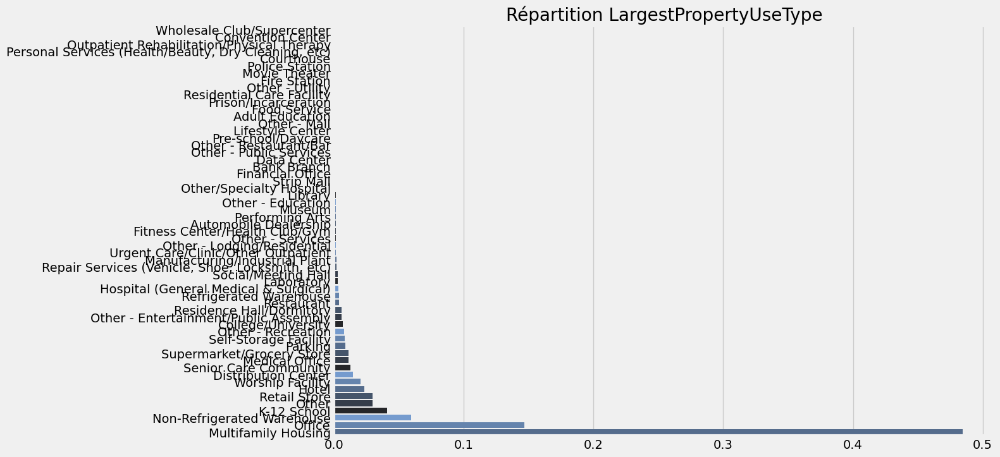

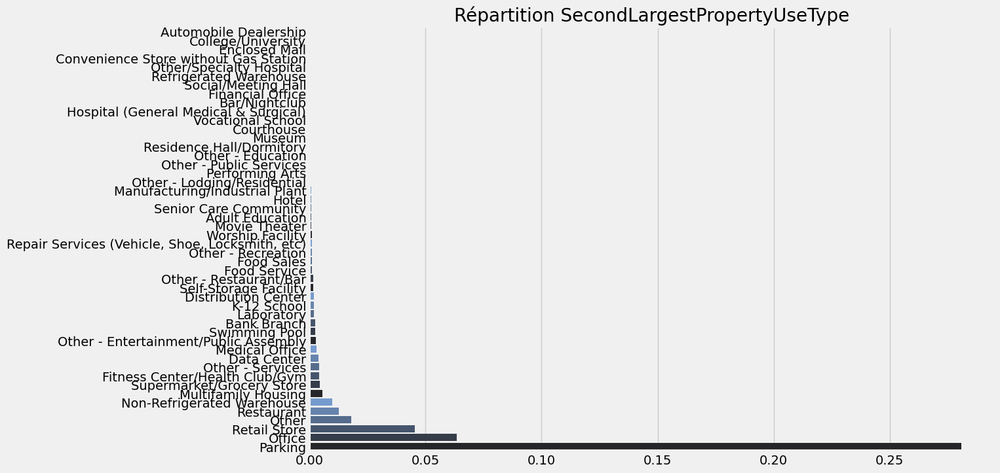

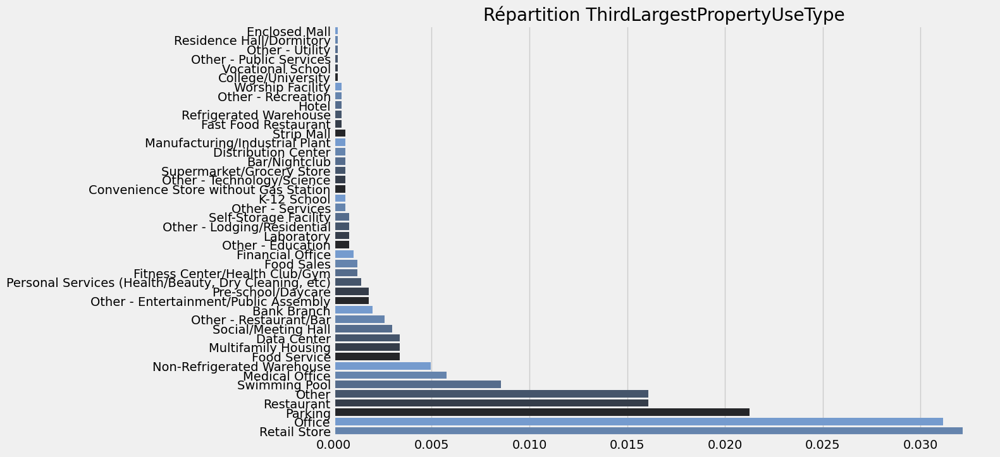

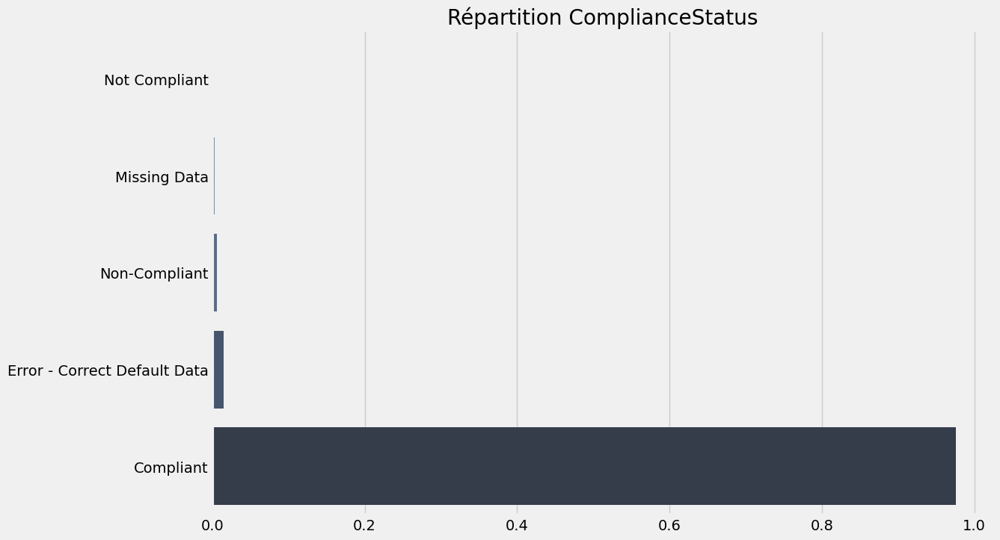

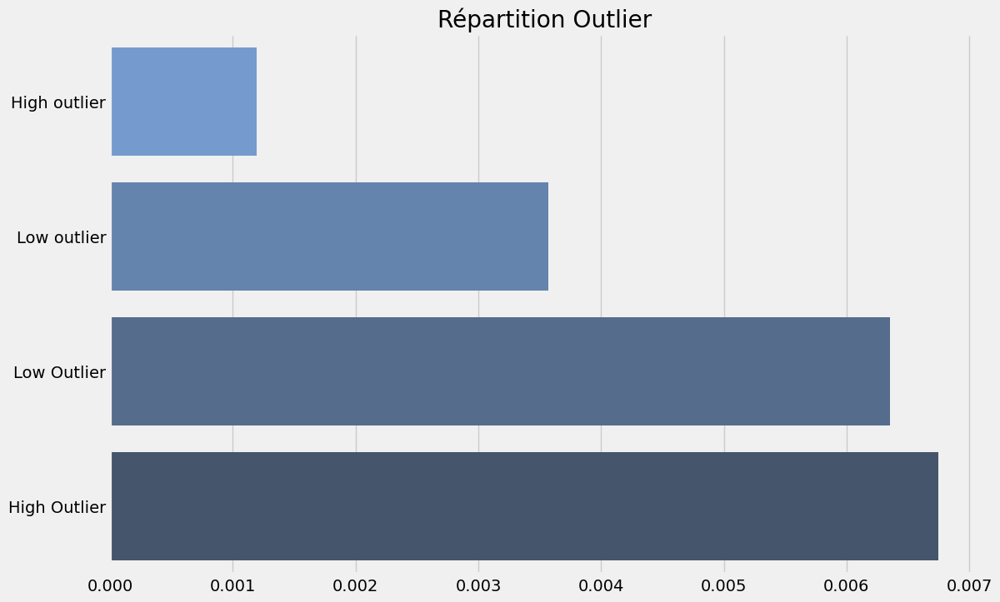

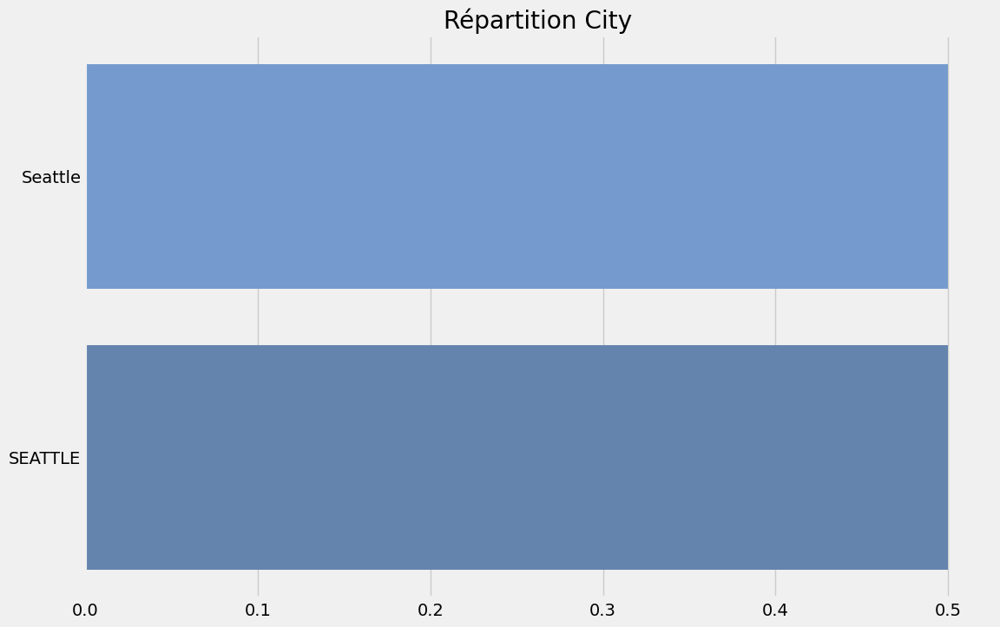

In [47]:
not_displayed = []
for col in train.select_dtypes(['object', 'category']):
    if len(train[col].unique()) > 1 and len(train[col].unique()) < 60:
        plt.figure()
        vc = (train[col].value_counts(dropna=False) / train[col].value_counts(dropna=False).sum()).sort_values()
        # Make the plot
        sns.barplot(y=vc.index, x=vc.values,  palette=sns.dark_palette("#69d", reverse=True))
        plt.title(f'Répartition {col}')
    else:
        not_displayed.append(col)
        
print(f'Features non affichées {not_displayed}')

Mes variables qualitatives m'indiquent pour la plupart l'utilisation du batiment (Utilisation premiere, secondaire, tertiaire). <br>
J'ai aussi une colonne m'indiquant la présence d'outlier. <br>

In [48]:
train.select_dtypes('object').isnull().sum()/train.shape[0]

BuildingType                     0.000000
PrimaryPropertyType              0.000000
PropertyName                     0.000000
TaxParcelIdentificationNumber    0.000397
Neighborhood                     0.000000
ListOfAllPropertyUseTypes        0.019456
LargestPropertyUseType           0.022633
SecondLargestPropertyUseType     0.511813
ThirdLargestPropertyUseType      0.826285
YearsENERGYSTARCertified         0.965257
ComplianceStatus                 0.000000
Outlier                          0.982132
Address                          0.000000
City                             0.000000
State                            0.000000
dtype: float64

SecondLargest et ThirdLargest ont beaucoup de NaNs, je pense les supprimer pour la suite. <br>
ListOfAllPropertyUseTypes apporte des infos redondantes avec Largest.., SecondLargest.. et ThirdLargest.. <br>
Outlier est une colonne utile nous guidant vers des outliers. <br>
Compliance Status = *Whether a property has met energy benchmarking requirements for the current reporting year.* <br> Je ne conserverai que les 'Compliant'. <br> <br>

In [49]:
train[['LargestPropertyUseType', 'SecondLargestPropertyUseType', 'ThirdLargestPropertyUseType', 'ListOfAllPropertyUseTypes', ]].sample(20)

,LargestPropertyUseType,SecondLargestPropertyUseType,ThirdLargestPropertyUseType,ListOfAllPropertyUseTypes
2304,Multifamily Housing,Parking,NaN,"Multifamily Housing, Parking"
835,Office,Retail Store,NaN,"Office, Retail Store"
1087,Office,Retail Store,Non-Refrigerated Warehouse,"Non-Refrigerated Warehouse, Office, Retail Store"
4608,Multifamily Housing,Parking,Other,"Multifamily Housing, Other, Parking"
2481,Supermarket/Grocery Store,NaN,NaN,Supermarket/Grocery Store
3756,Multifamily Housing,Parking,NaN,"Multifamily Housing, Parking"
3181,Office,Restaurant,NaN,"Office, Restaurant"
3982,Office,Other - Recreation,Retail Store,"Office, Other - Recreation, Parking, Retail Store"
4727,Multifamily Housing,Parking,Retail Store,"Multifamily Housing, Parking, Retail Store"
16,Office,Parking,Financial Office,"Convenience Store without Gas Station, Data Ce..."


In [50]:
train.DefaultData.value_counts()

False    4549
True      488
Name: DefaultData, dtype: int64

DefaultData = *The property used default data for at least one property characteristic.* <br>
Je cherche à avoir des caractéristiques réelles et non théoriques pour construire mon modèle, je supprimerai donc les valeurs non True.

## Analyse bivariée target

Je cherche ici à observer l'influence de mes autres variables sur mes targets.

### BuildingType

Quels types de batiments polluent le + ? <br>
J'exclue les batiments résidentiels.

In [51]:
train = train[~train.BuildingType.str.contains('Multifamily')]

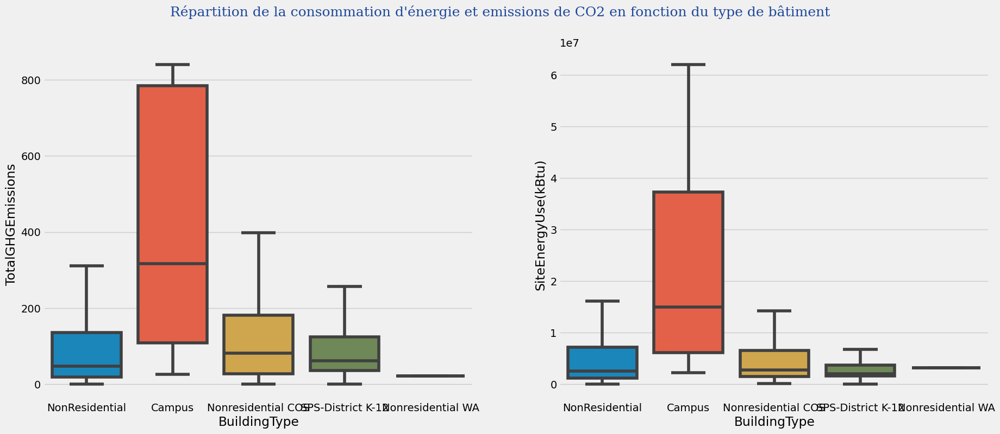

In [52]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(20,8))
sns.boxplot(x='BuildingType',y='TotalGHGEmissions',data=train, ax=axs[0], showfliers=False)
sns.boxplot(x='BuildingType',y='SiteEnergyUse(kBtu)',data=train, ax=axs[1], showfliers=False)
plt.suptitle("Répartition de la consommation d'énergie et emissions de CO2 en fonction du type de bâtiment", 
             fontdict=font_title, fontsize=18)
plt.show()

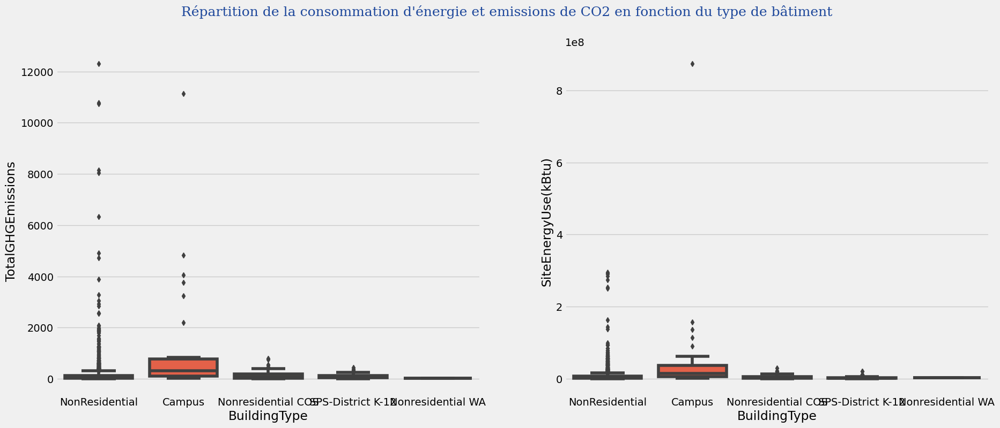

In [53]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(20,8))
sns.boxplot(x='BuildingType',y='TotalGHGEmissions',data=train, ax=axs[0], showfliers=True)
sns.boxplot(x='BuildingType',y='SiteEnergyUse(kBtu)',data=train, ax=axs[1], showfliers=True)
plt.suptitle("Répartition de la consommation d'énergie et emissions de CO2 en fonction du type de bâtiment", 
             fontdict=font_title, fontsize=18)
plt.show()

On note que les batiments du type 'Campus' sont responsables des plus fortes émission de gaz à effet de serre/Consommation électrique. <br>
On observe aussi des variables particulièrement fortes pour les types Non-Residential et Campus, il s'agit peut-être d'outliers. <br>

### YearBuilt

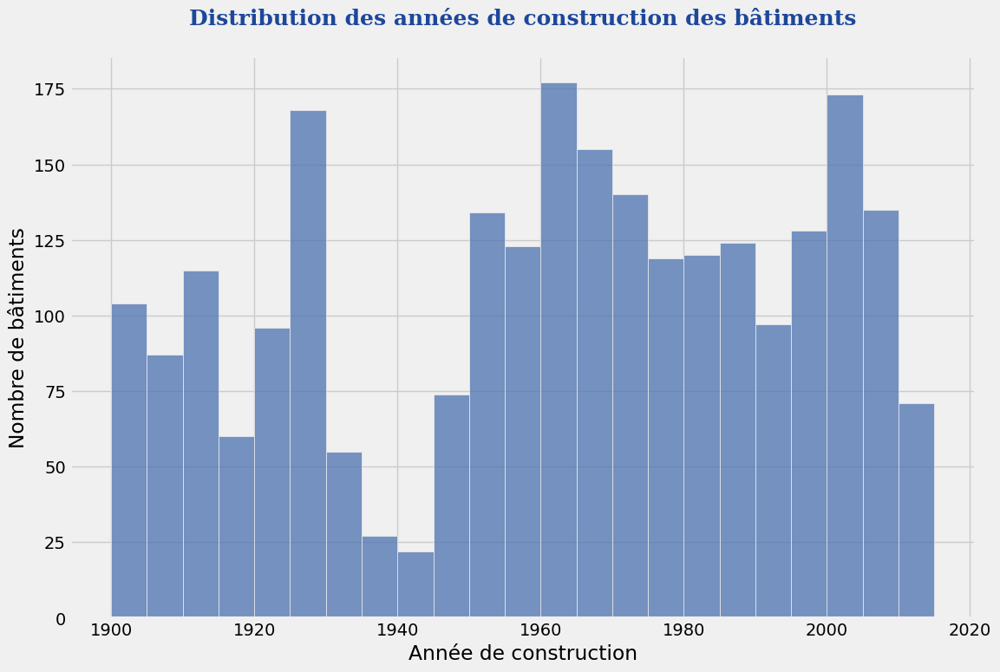

In [54]:
fig = plt.figure(figsize=(12,8))
ax = sns.histplot(data=train, x='YearBuilt', bins=int((train.YearBuilt.max() - train.YearBuilt.min())/5), color=sns.color_palette('deep')[0])
ax.set_xlabel("Année de construction")
ax.set_ylabel("Nombre de bâtiments")
plt.title(f"Distribution des années de construction des bâtiments\n", fontdict=font_title)
plt.show()

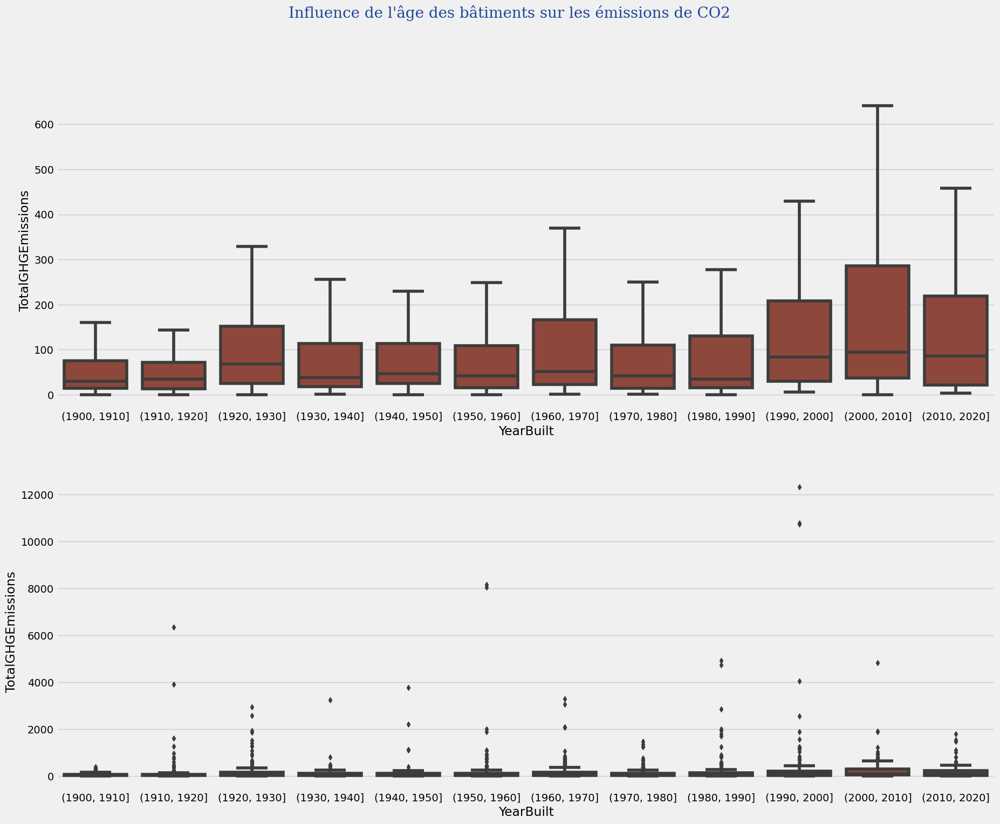

In [55]:
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(20,16))

bins = pd.IntervalIndex.from_tuples([(1900, 1910), (1910, 1920), (1920, 1930), (1930, 1940), (1940, 1950), 
                                     (1950, 1960), (1960, 1970), (1970,1980), (1980,1990), (1990,2000), 
                                     (2000,2010), (2010,2020)])

fig.suptitle("Influence de l'âge des bâtiments sur les émissions de CO2", fontsize=20, fontdict=font_title)

sns.boxplot(
    data=train, ax=axs[0],
    x=pd.cut(train.YearBuilt, bins=bins), y="TotalGHGEmissions",
    color="#9C3E2D", showfliers=False
)

sns.boxplot(
    data=train, ax=axs[1],
    x=pd.cut(train.YearBuilt, bins=bins), y="TotalGHGEmissions",
    color="#9C3E2D", showfliers=True
)

plt.show()

On remarque tout d'abord qu'encore une fois, la méthode des IQR met en avant de nombreux outliers. <br>
Il semblerait qu'il y ait une répartition plus large dans l'émission de CO2 pour les batiments construits récemment (1990 - 2016). <br><br>
Hypothèse: Les batiments les plus récents polluent plus. <br>
J'étudie l'âge des batiments plutot que leur année de construction.

In [56]:
train['BuildingAge'] = train['DataYear'] - train['YearBuilt']

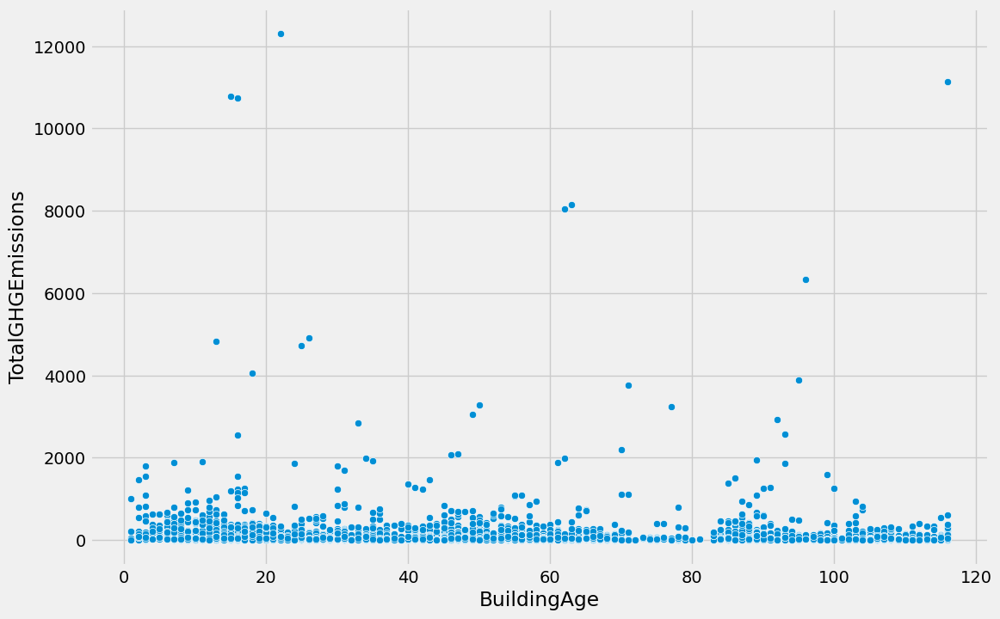

In [57]:
plt.figure(figsize=(12,8))
sns.scatterplot(data=train, x='BuildingAge', y='TotalGHGEmissions')
plt.show()

Difficile d'observer une qqconque corrélation ici.

In [58]:
train[['BuildingAge', 'TotalGHGEmissions', 'SiteEnergyUse(kBtu)']].corr()

,BuildingAge,TotalGHGEmissions,SiteEnergyUse(kBtu)
BuildingAge,1.000000,-0.056224,-0.080104
TotalGHGEmissions,-0.056224,1.000000,0.851639
SiteEnergyUse(kBtu),-0.080104,0.851639,1.000000


## Analyse géographique

In [9]:
import folium

In [7]:
train.head()

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),TotalGHGEmissions,GHGEmissionsIntensity,DefaultData,ComplianceStatus,Outlier,Latitude,Longitude,Address,City,State,ZipCode
0,27081,2015,Multifamily MR (5-9),Residence/Hotel/Senior Care/Housing,SOUNDVIEW,3902100225,1,SOUTHWEST,2001,1.0,6.0,108066,32436,75630,"Multifamily Housing, Retail Store",Multifamily Housing,71549.0,Retail Store,4081.0,NaN,NaN,NaN,NaN,27.500000,29.500000,86.200000,92.500000,2.076506e+06,2.228807e+06,0.0,6.085890e+05,2076592.0,0.000000,0.0,14.48,0.05,False,Compliant,NaN,47.558450,-122.387198,4815 CALIFORNIA AVE SW,SEATTLE,WA,98116.0
1,19519,2016,Multifamily MR (5-9),Residence/Hotel/Senior Care/Housing,Asia Condo HOA,0086000000,2,DOWNTOWN,2002,1.0,7.0,66849,0,66849,Multifamily Housing,Multifamily Housing,66849.0,NaN,NaN,NaN,NaN,NaN,NaN,28.400000,29.500000,89.199997,92.599998,1.898210e+06,1.972025e+06,0.0,5.563335e+05,1898210.0,0.000000,0.0,13.23,0.20,False,Compliant,NaN,47.596960,-122.324120,668 S Lane St,Seattle,WA,98104.0
2,2,2015,NonResidential,Residence/Hotel/Senior Care/Housing,PARAMOUNT HOTEL,659000220,7,DOWNTOWN,1996,1.0,11.0,103566,15064,88502,"Hotel, Parking, Restaurant",Hotel,83880.0,Parking,15064.0,Restaurant,4622.0,NaN,51.0,94.400000,99.000000,191.300000,195.200000,8.354235e+06,8.765788e+06,0.0,1.144563e+06,3905411.0,44490.000000,4448985.0,263.51,2.38,False,Compliant,NaN,47.613106,-122.333358,724 PINE ST,SEATTLE,WA,98101.0
3,25547,2016,Multifamily MR (5-9),Residence/Hotel/Senior Care/Housing,OK Hotel,5247800090,7,DOWNTOWN,1914,1.0,5.0,42534,0,42534,"Multifamily Housing, Parking",Multifamily Housing,25341.0,Parking,0.0,NaN,NaN,NaN,84.0,69.599998,72.300003,138.500000,141.300003,1.764410e+06,1.832173e+06,0.0,2.324767e+05,793211.0,9711.990234,971199.0,57.11,1.34,False,Compliant,NaN,47.600380,-122.335170,212 Alaskan Way S,Seattle,WA,98104.0
4,25479,2016,Multifamily LR (1-4),Residence/Hotel/Senior Care/Housing,Ravenna,7170600000,4,NORTHEAST,1978,1.0,3.0,20390,0,20390,Multifamily Housing,Multifamily Housing,20390.0,NaN,NaN,NaN,NaN,NaN,NaN,24.200001,26.200001,75.800003,82.400002,4.924219e+05,5.351643e+05,0.0,1.443206e+05,492422.0,0.000000,0.0,3.43,0.17,False,Compliant,NaN,47.667680,-122.303700,2211 NE 54th St,Seattle,WA,98105.0


In [22]:
map = folium.Map(location=[47.558450, -122.387198])

for i in range(0,train.shape[0]):
    folium.Circle(
      location=[train.iloc[i]['Latitude'], train.iloc[i]['Longitude']],
      radius=train.iloc[i]['TotalGHGEmissions'],
      color='crimson',
      popup=train.iloc[i]['PropertyName'],
      fill=True,
      fill_color='crimson'
    ).add_to(map)


map

L'exploration étant terminée, je peux passer au preprocessing et à la modélisation.